Comparison between the ages for the sexes and microbiotes

**Table of content**
1. [Differentially expressed genes](#Differentially-expressed-genes)
2. [Stats about the DEG](#Stats-about-the-DEG)
3. [DEG with significant p-value and fold change](#DEG-with-significant-p-value-and-fold-change)
    1. [Log2FC](#Log2FC)
    2. [Z-score](#Z-score)
4. [Co-expression (WGCNA)](#Co-expression-(WGCNA))
    1. [Z-score in modules](#Z-score-in-modules)
    2. [Genes in modules](#Genes-in-modules)
5. [Enrichment analysis](#Enrichment-analysis)
    1. [GO analysis](#GO-analysis)
    2. [KEGG pathways](#KEGG-pathways)
    
    
*Generated from a Jupyter Notebook - [Sources](https://github.com/bebatut/neuromac_GF_mices/blob/master/src/age-effect-microbiote-sex.ipynb)*

# Loads

## Libraries and functions

In [1]:
source("load_libraries.R")

Warning message in is.na(x[[i]]):
“is.na() applied to non-(list or vector) of type 'environment'”Warning message in rsqlite_fetch(res@ptr, n = n):
“Don't need to call dbFetch() for statements, only for queries”

*
*  Package WGCNA 1.63 loaded.
*
*    Important note: It appears that your system supports multi-threading,
*    but it is not enabled within WGCNA in R. 
*    To allow multi-threading within WGCNA with all available cores, use 
*
*          allowWGCNAThreads()
*
*    within R. Use disableWGCNAThreads() to disable threading if necessary.
*    Alternatively, set the following environment variable on your system:
*
*          ALLOW_WGCNA_THREADS=<number_of_processors>
*
*    for example 
*
*          ALLOW_WGCNA_THREADS=4
*
*    To set the environment variable in linux bash shell, type 
*
*           export ALLOW_WGCNA_THREADS=4
*
*     before running R. Other operating systems or shells will
*     have a similar command to achieve the same aim.
*


Allowing multi-threading with up to 4 threads.
[1] "preparing gene to GO mapping data..."
[1] "preparing IC data..."
[1] "preparing gene to GO mapping data..."
[1] "preparing IC data..."
[1] "preparing gene to GO mapping data..."
[1] "prepar

In [2]:
source("functions.R")

## Data

In [3]:
load("../results/dge/gene_length.RData")
load("../results/dge/filtered_metadata.RData")
load("../results/dge/dge.RData")
load("../results/dge/contrasts.RData")
load("../results/dge/filtered_norm_counts.RData")
load("../results/dge/filtered_z_scores.RData")
load("../results/dge/dge_net_pal2.RData")
load("../results/dge/col_order.RData")
load("../results/dge/annot_col.RData")
load("../results/dge/annot_colors.RData")
load("../results/dge/genes_in_modules.RData")
load("../results/dge/all_deg_genes.RData")

In [4]:
dir_path = "age-effect/age-microbiota-sex/"

# Extraction of the differentially expressed genes

Extract DEG between Middle-aged and Young, Old and Young and Old and Middle-aged for the different sex and microbiota combinations
- Threshold for adjusted p-value: 0.05
- Threshold for adjusted significant fold change: 1.5

Table with the factors

In [5]:
sub_contrasts = contrasts %>%
    filter(Info == 'Middle-aged vs Young (Female, SPF)' | 
           Info == 'Middle-aged vs Young (Female, GF)' | 
           Info == 'Middle-aged vs Young (Male, SPF)' | 
           Info == 'Middle-aged vs Young (Male, GF)' | 
           Info == 'Old vs Young (Female, SPF)' | 
           Info == 'Old vs Young (Female, GF)' | 
           Info == 'Old vs Young (Male, SPF)' | 
           Info == 'Old vs Young (Male, GF)' | 
           Info == 'Old vs Middle-aged (Female, SPF)' | 
           Info == 'Old vs Middle-aged (Female, GF)' | 
           Info == 'Old vs Middle-aged (Male, SPF)' | 
           Info == 'Old vs Middle-aged (Male, GF)')
sub_contrasts

Info,Intercept,Male vs Female,GF vs SPF,Middle-aged vs Young,Old vs Young,Male & Middle-aged,Male & Old,Male & GF,GF & Middle-aged,GF & Old
"Middle-aged vs Young (Female, SPF)",0,0,0,1,0,0,0,0,0,0
"Middle-aged vs Young (Female, GF)",0,0,0,1,0,0,0,0,1,0
"Middle-aged vs Young (Male, SPF)",0,0,0,1,0,1,0,0,0,0
"Middle-aged vs Young (Male, GF)",0,0,0,1,0,1,0,0,1,0
"Old vs Young (Female, SPF)",0,0,0,0,1,0,0,0,0,0
"Old vs Young (Female, GF)",0,0,0,0,1,0,0,0,0,1
"Old vs Young (Male, SPF)",0,0,0,0,1,0,1,0,0,0
"Old vs Young (Male, GF)",0,0,0,0,1,0,1,0,0,1
"Old vs Middle-aged (Female, SPF)",0,0,0,-1,1,0,0,0,0,0
"Old vs Middle-aged (Female, GF)",0,0,0,-1,1,0,0,0,-1,1


In [6]:
deg_results = lapply(sub_contrasts$Info, function(x) get_dge_results(x, dge, sub_contrasts))
names(deg_results) = sub_contrasts$Info

Extract the log2FC of the DEG

In [7]:
deg = extract_DEG_log2FC(deg_results, dir_path)

In [8]:
all_deg_genes = unique(c(all_deg_genes, deg$sign_fc_deg$genes))
save(all_deg_genes, file="../results/dge/all_deg_genes.RData")

# Stats about the DEG

Using type as id variables


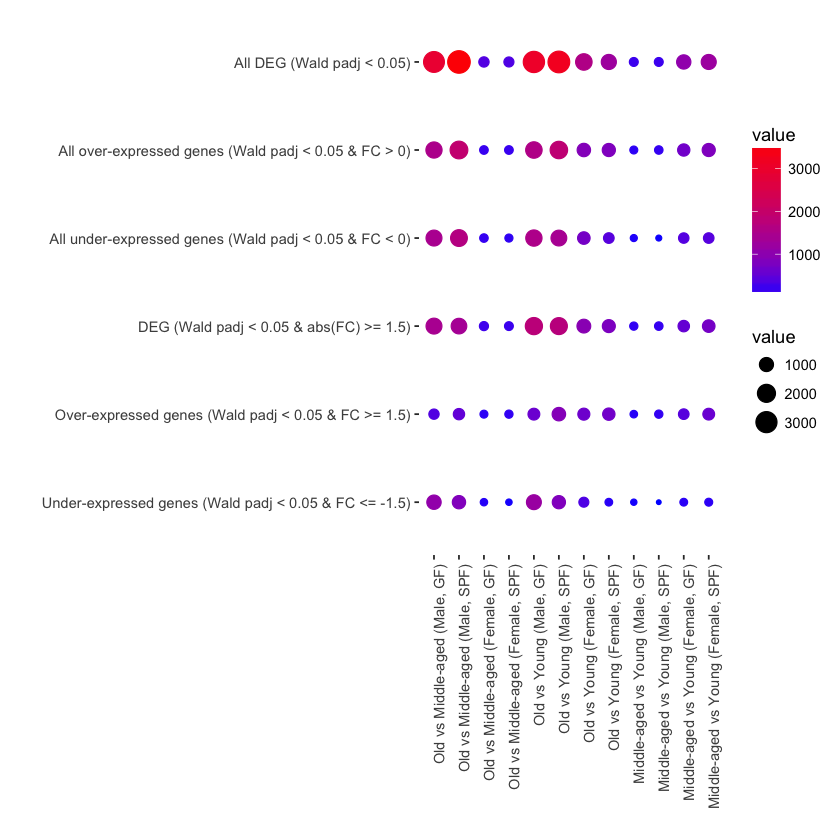

,"Middle-aged vs Young (Female, SPF)","Middle-aged vs Young (Female, GF)","Middle-aged vs Young (Male, SPF)","Middle-aged vs Young (Male, GF)","Old vs Young (Female, SPF)","Old vs Young (Female, GF)","Old vs Young (Male, SPF)","Old vs Young (Male, GF)","Old vs Middle-aged (Female, SPF)","Old vs Middle-aged (Female, GF)","Old vs Middle-aged (Male, SPF)","Old vs Middle-aged (Male, GF)"
All DEG (Wald padj < 0.05),1205,1038,213,215,1223,1562,3224,3066,337,366,3554,2910
All over-expressed genes (Wald padj < 0.05 & FC > 0),806,655,176,134,814,863,1837,1558,192,187,1911,1486
All under-expressed genes (Wald padj < 0.05 & FC < 0),399,383,37,81,409,699,1387,1508,145,179,1643,1424
DEG (Wald padj < 0.05 & abs(FC) >= 1.5),706,526,179,156,783,938,1700,1756,207,234,1347,1418
Over-expressed genes (Wald padj < 0.05 & FC >= 1.5),572,404,159,108,666,612,876,581,155,134,505,364
Under-expressed genes (Wald padj < 0.05 & FC <= -1.5),134,122,20,48,117,326,824,1175,52,100,842,1054


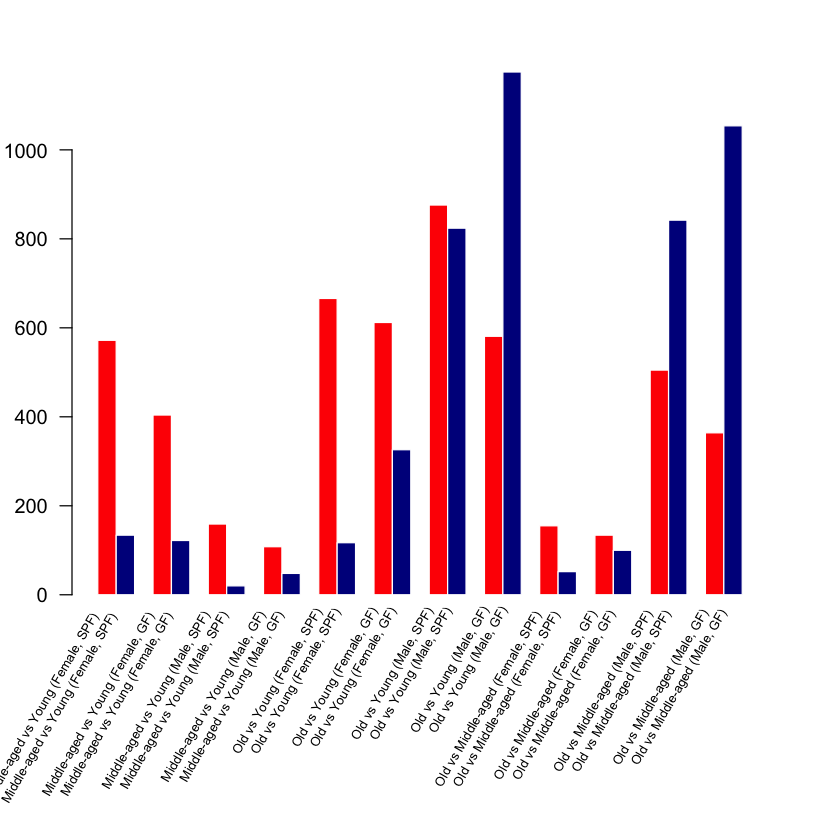

In [9]:
deg = extract_DEG_stats(deg, dir_path)
deg$stat

All DEG (Wald padj < 0.05)

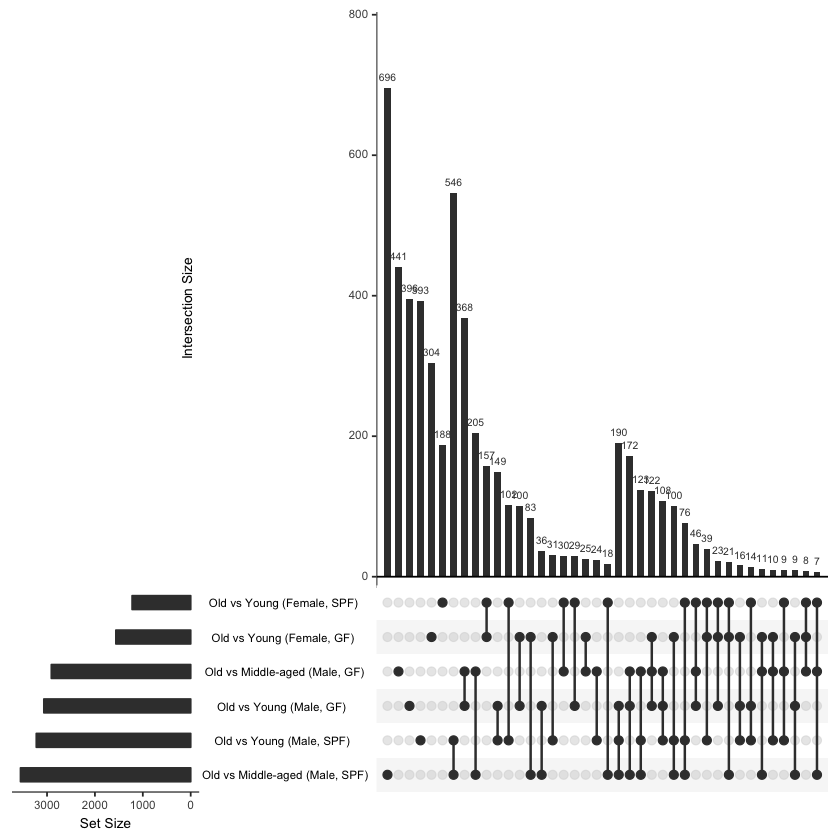

In [10]:
plot_sign_DEG_upset(deg)

DEG (Wald padj < 0.05 & abs(FC) > 1.5)

pdf 
  2

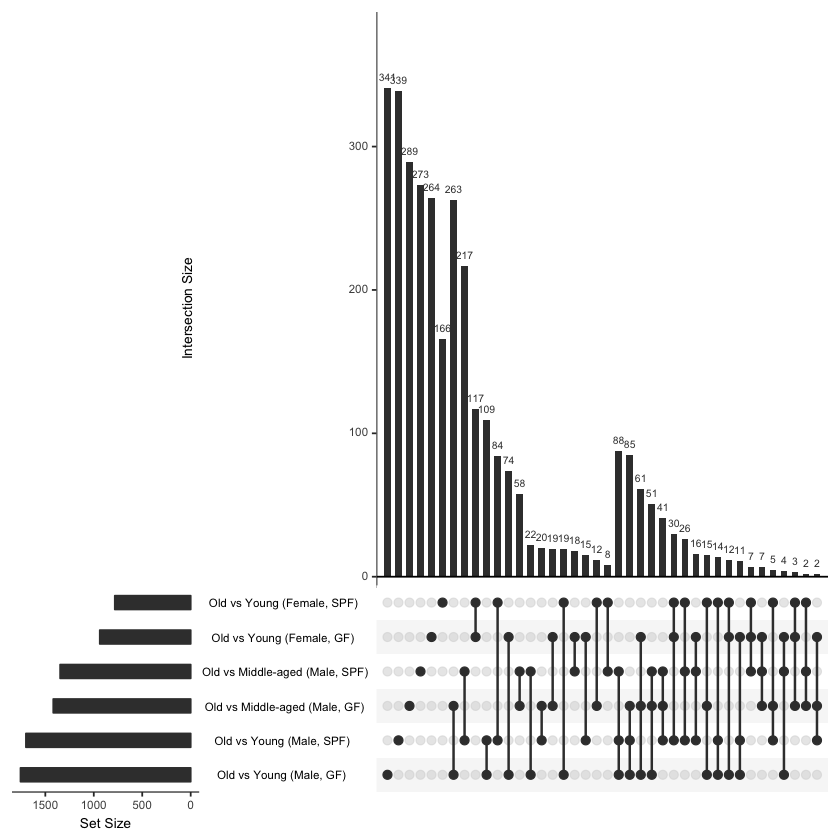

In [11]:
pdf(paste('../results/dge/', dir_path, '/sign_FC_DEG_upset.pdf', sep=''))
plot_sign_FC_DEG_upset(deg)
dev.off()
plot_sign_FC_DEG_upset(deg)

# DEG with significant p-value and fold change

## Log2FC

,Comparison,Sex,Microbiota
"Middle-aged vs Young (Female, SPF)",Middle-aged VS Young,Female,SPF
"Middle-aged vs Young (Female, GF)",Middle-aged VS Young,Female,GF
"Middle-aged vs Young (Male, SPF)",Middle-aged VS Young,Male,SPF
"Middle-aged vs Young (Male, GF)",Middle-aged VS Young,Male,GF
"Old vs Young (Female, SPF)",Old VS Young,Female,SPF
"Old vs Young (Female, GF)",Old VS Young,Female,GF
"Old vs Young (Male, SPF)",Old VS Young,Male,SPF
"Old vs Young (Male, GF)",Old VS Young,Male,GF
"Old vs Middle-aged (Female, SPF)",Old VS Middle-aged,Female,SPF
"Old vs Middle-aged (Female, GF)",Old VS Middle-aged,Female,GF


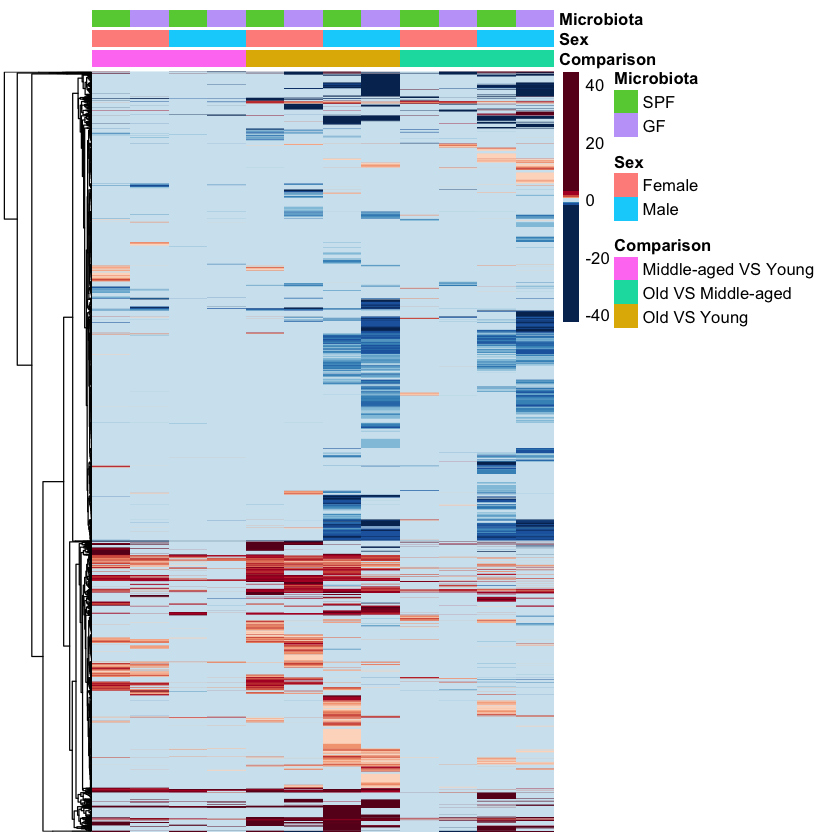

In [12]:
data = deg$sign_fc_deg %>% select(-genes)
fc_annot = data.frame(Comparison = c(rep("Middle-aged VS Young",4), rep("Old VS Young",4), rep("Old VS Middle-aged",4)),
                      Sex = rep(c(rep("Female",2),rep("Male",2)),3),
                      Microbiota = rep(c("SPF","GF"),6),
                      row.names = colnames(data))
fc_annot
plot_fc_heatmap(data, fc_annot)

## Z-score

In [13]:
comps = list(
    "Middle-aged vs Young (Female, SPF)" = c(grep("SPF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Old vs Middle-aged (Female, SPF)" = c(grep("SPF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Old vs Young (Female, SPF)" = c(grep("SPF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Middle-aged vs Young (Male, SPF)" = c(grep("SPF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Old vs Middle-aged (Male, SPF)" = c(grep("SPF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Old vs Young (Male, SPF)" = c(grep("SPF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE)),    
    "Middle-aged vs Young (Female, GF)" = c(grep("GF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Old vs Middle-aged (Female, GF)" = c(grep("GF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Old vs Young (Female, GF)" = c(grep("GF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Middle-aged vs Young (Male, GF)" = c(grep("GF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Old vs Middle-aged (Male, GF)" = c(grep("GF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE)),
    "Old vs Young (Male, GF)" = c(grep("GF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE))
)

### Column order: microbiota - sex - age

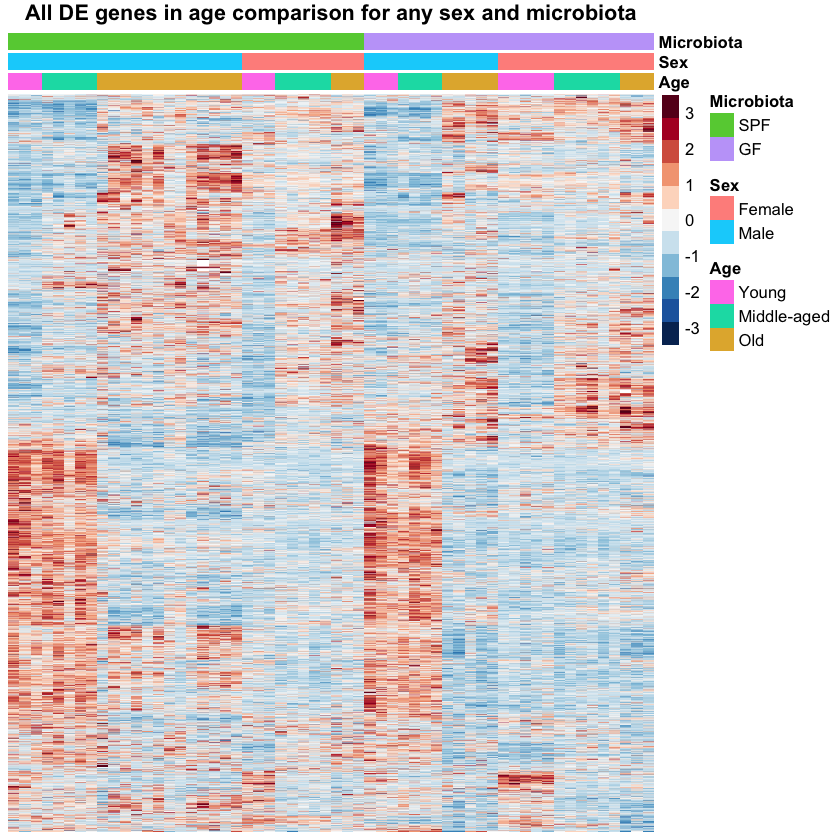

In [14]:
plot_z_score_heatmap(z_scores,
                     deg$sign_fc_deg$genes,
                     col_order$msa,
                     annot_col$msa,
                     "All DE genes in age comparison for any sex and microbiota",
                     col_order$msa)

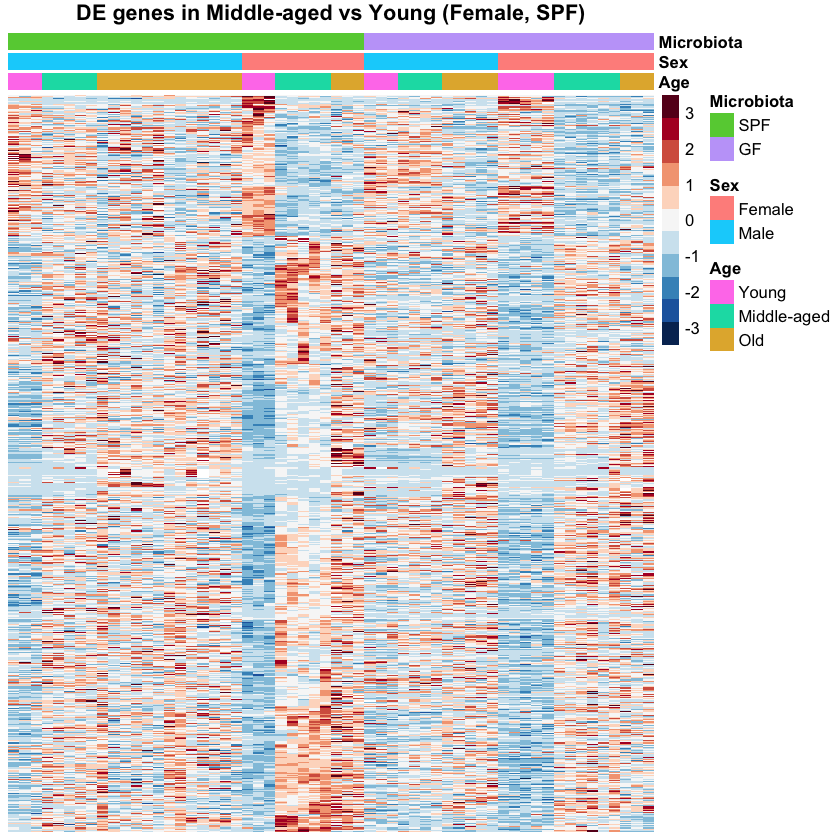

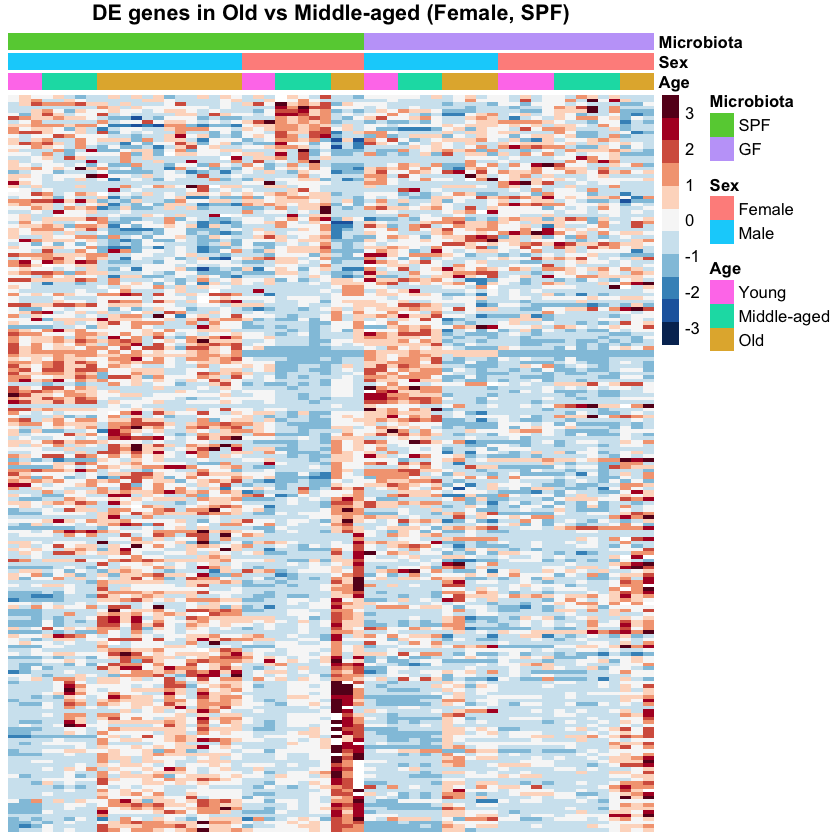

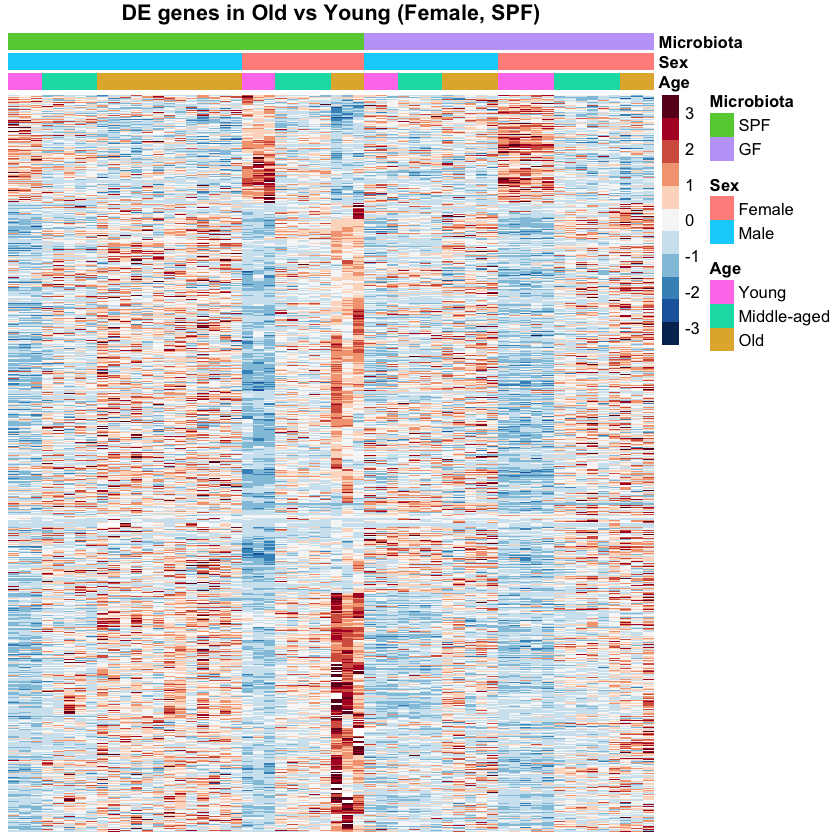

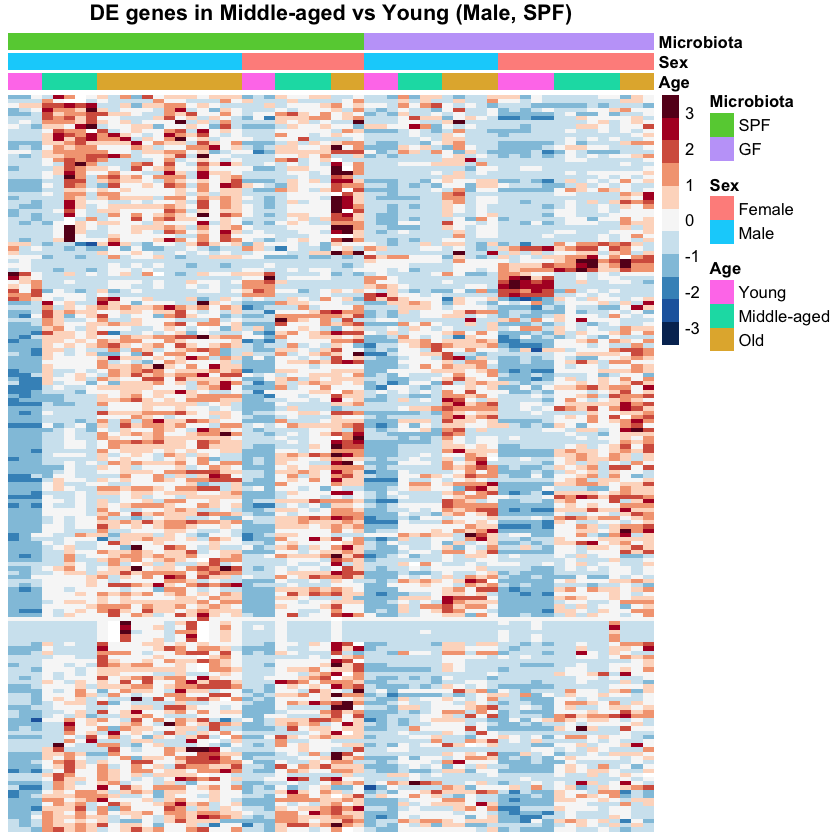

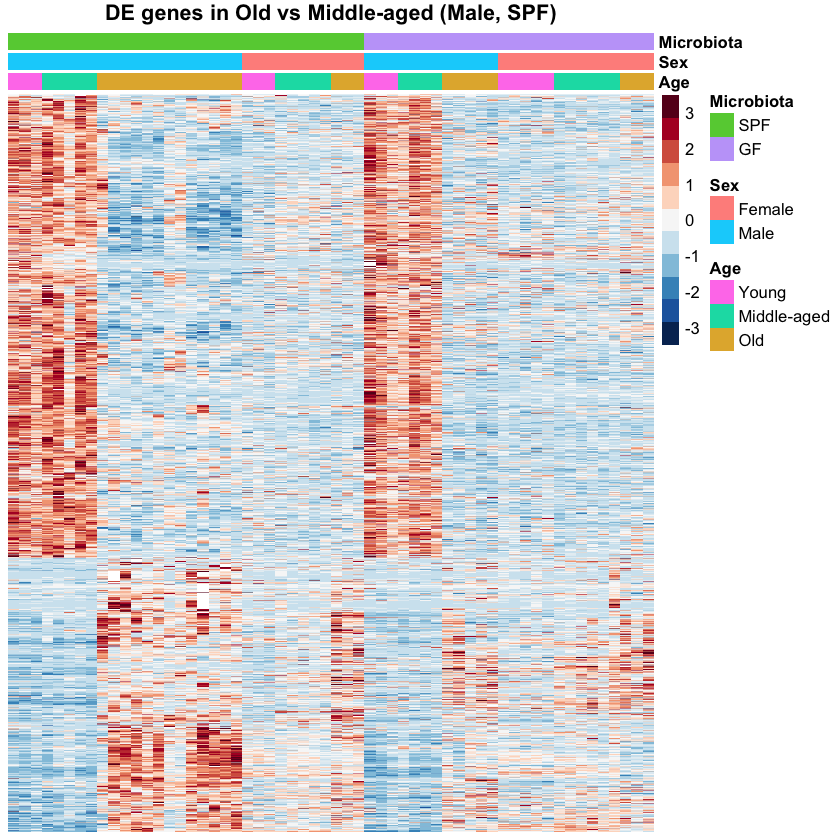

...

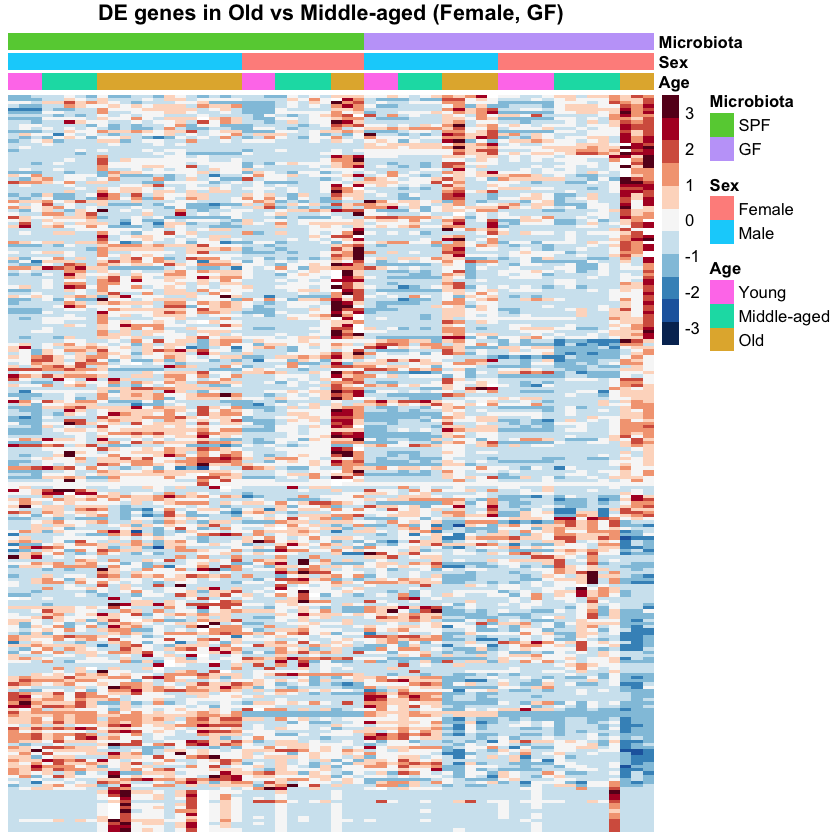

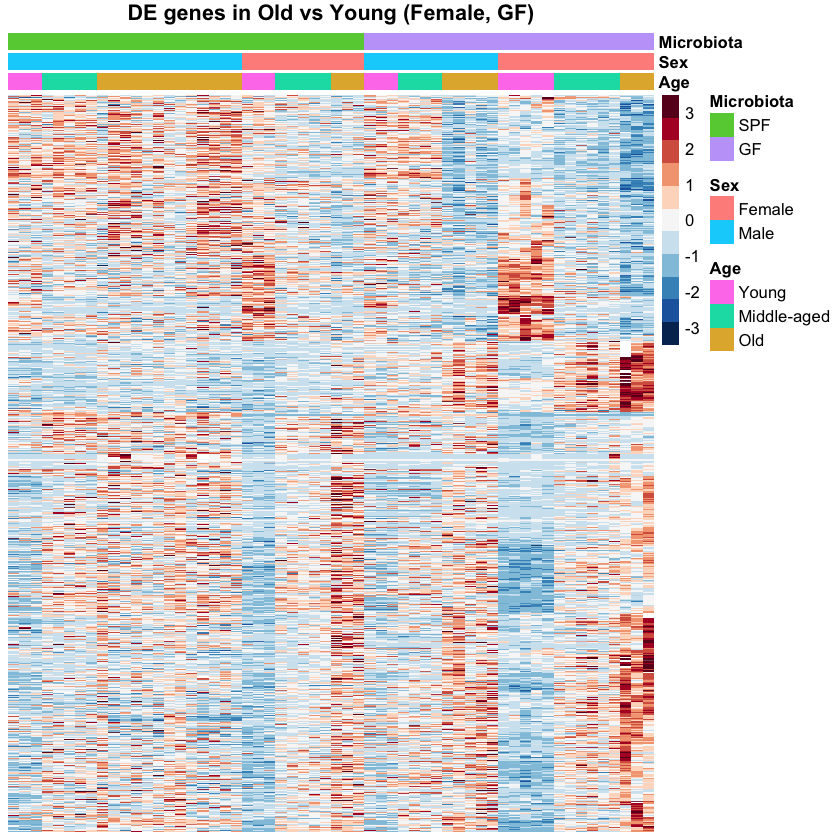

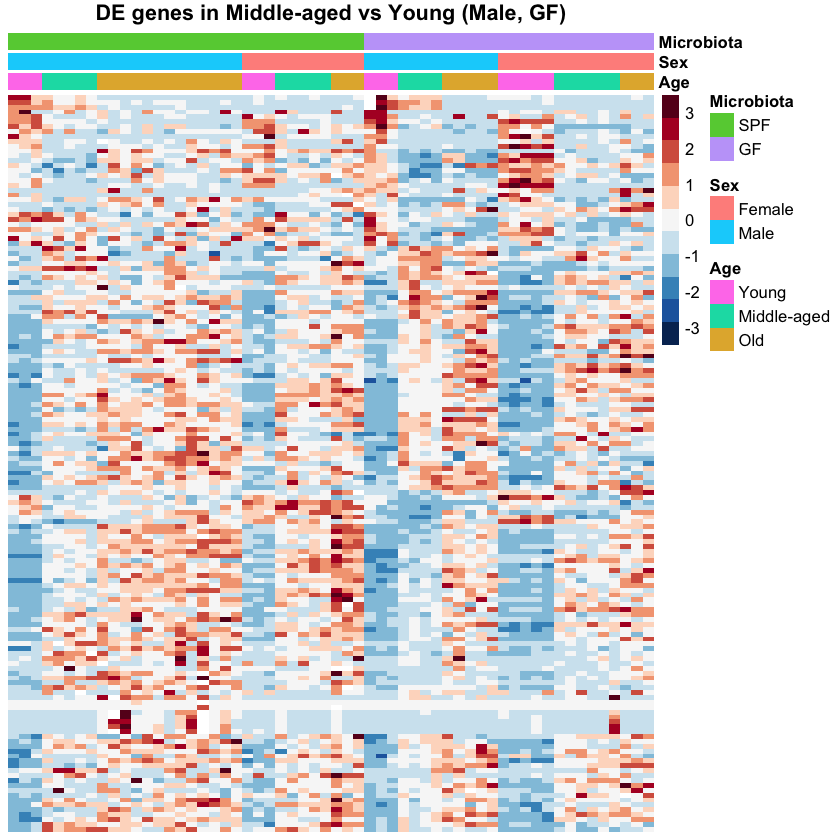

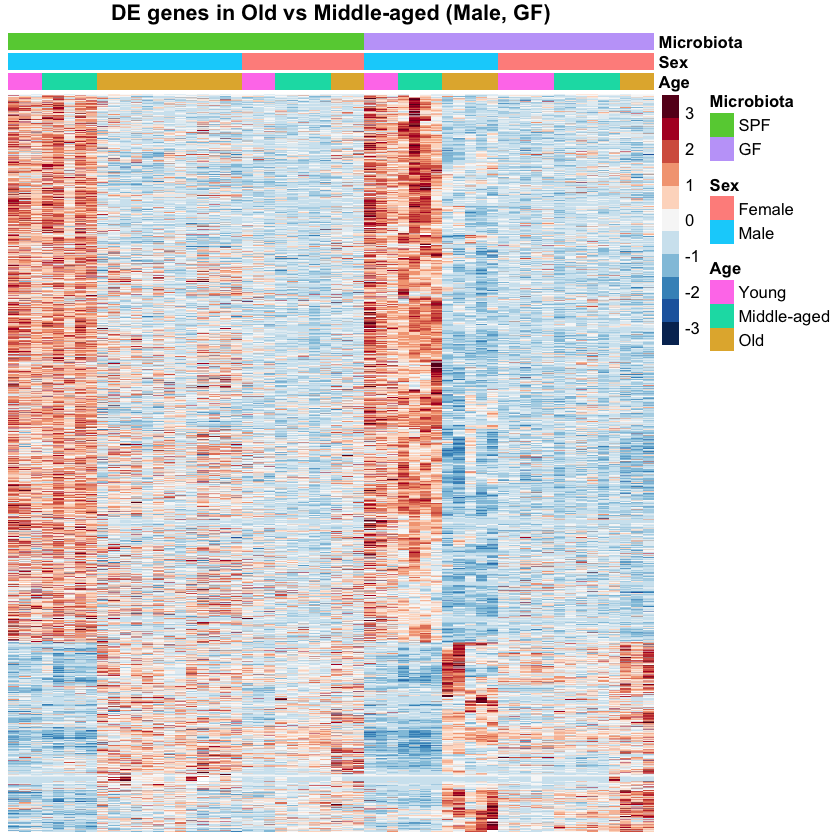

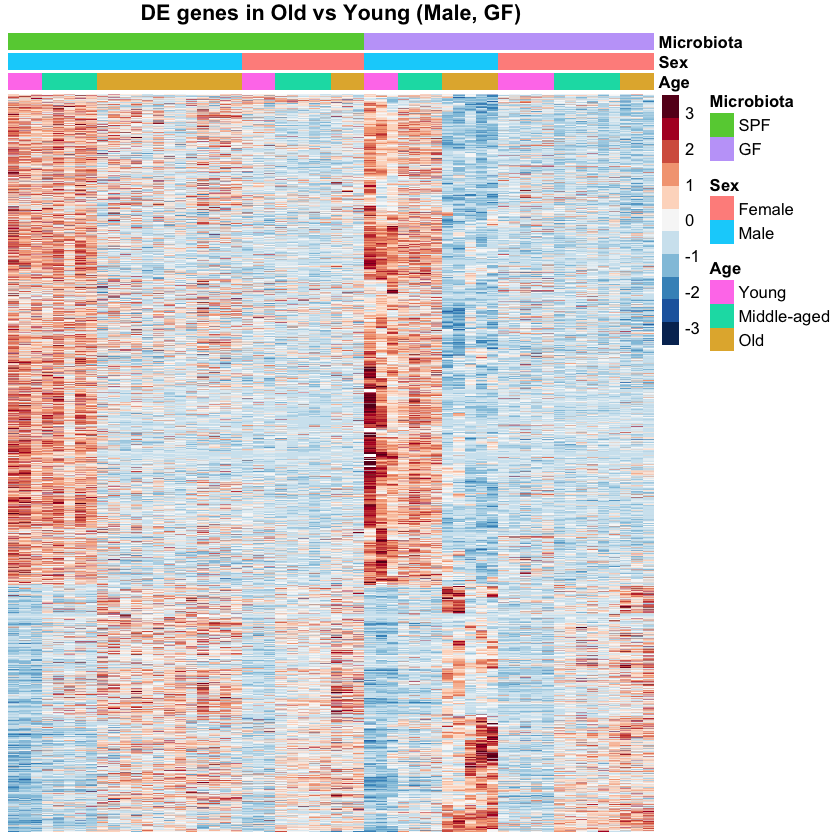

In [15]:
for(comp in names(comps)){
    plot_z_score_heatmap(z_scores,
        deg$sign_fc_deg %>% filter(!is.na((!!as.name(comp)))) %>% pull(genes),
        col_order$msa,
        annot_col$msa,
        paste("DE genes in", comp),
        comps[[comp]])
}

### Column order: sex - microbiota - age

pdf 
  2

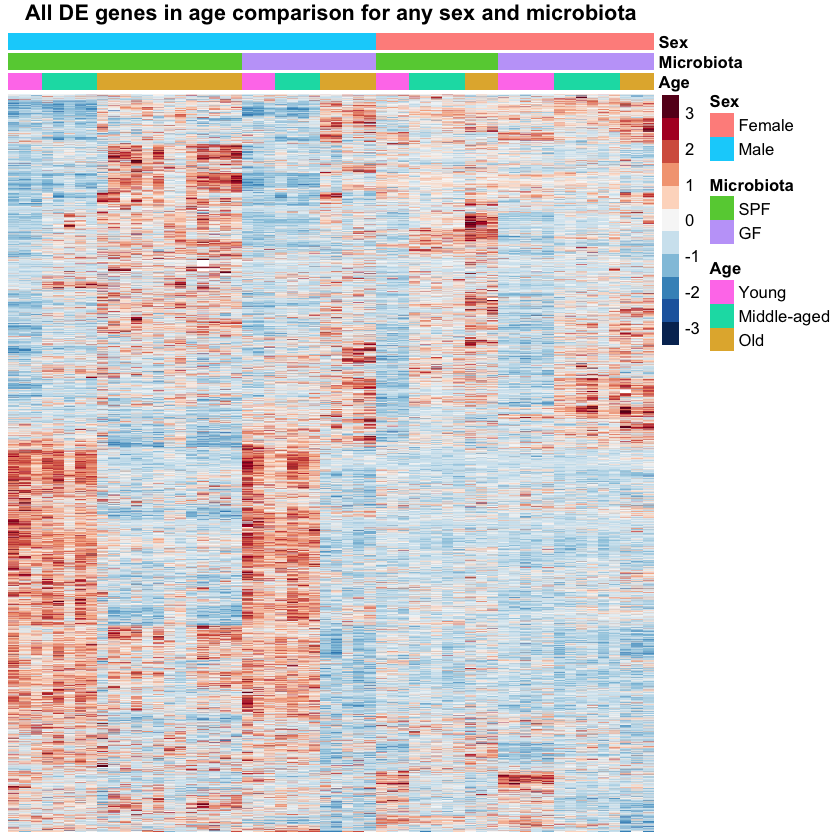

In [16]:
plot_z_score_heatmap(z_scores,
                     deg$sign_fc_deg$genes,
                     col_order$sma,
                     annot_col$sma,
                     "All DE genes in age comparison for any sex and microbiota",
                     col_order$sma)
pdf(paste('../results/dge/', dir_path, '/z_score_sma.pdf', sep=''))
plot_z_score_heatmap(z_scores,
                     deg$sign_fc_deg$genes,
                     col_order$sma,
                     annot_col$sma,
                     "All DE genes in age comparison for any sex and microbiota",
                     col_order$sma)
dev.off()

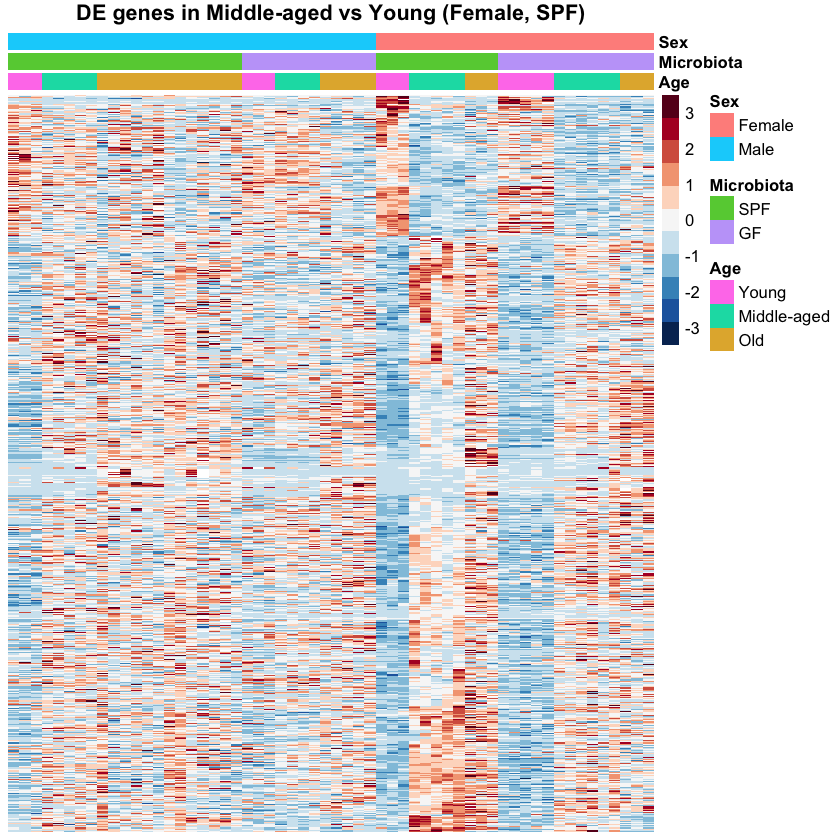

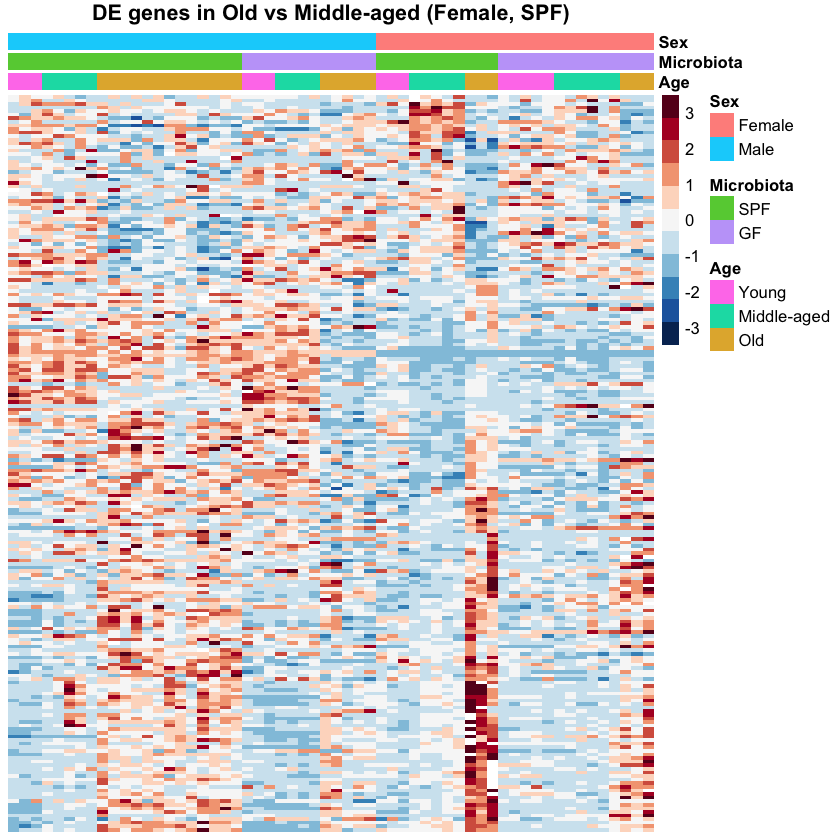

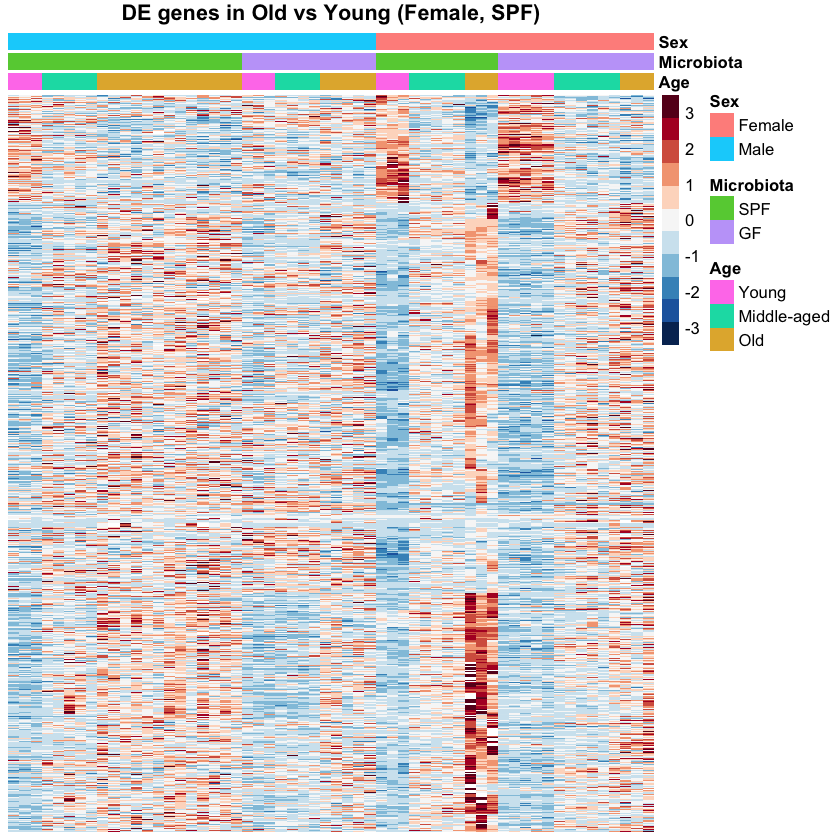

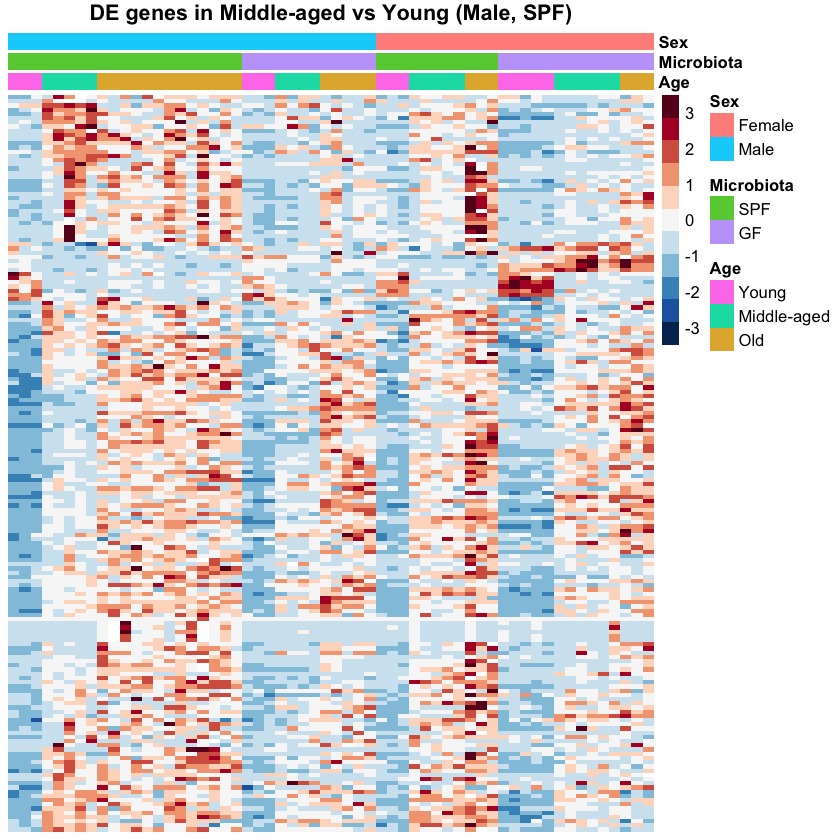

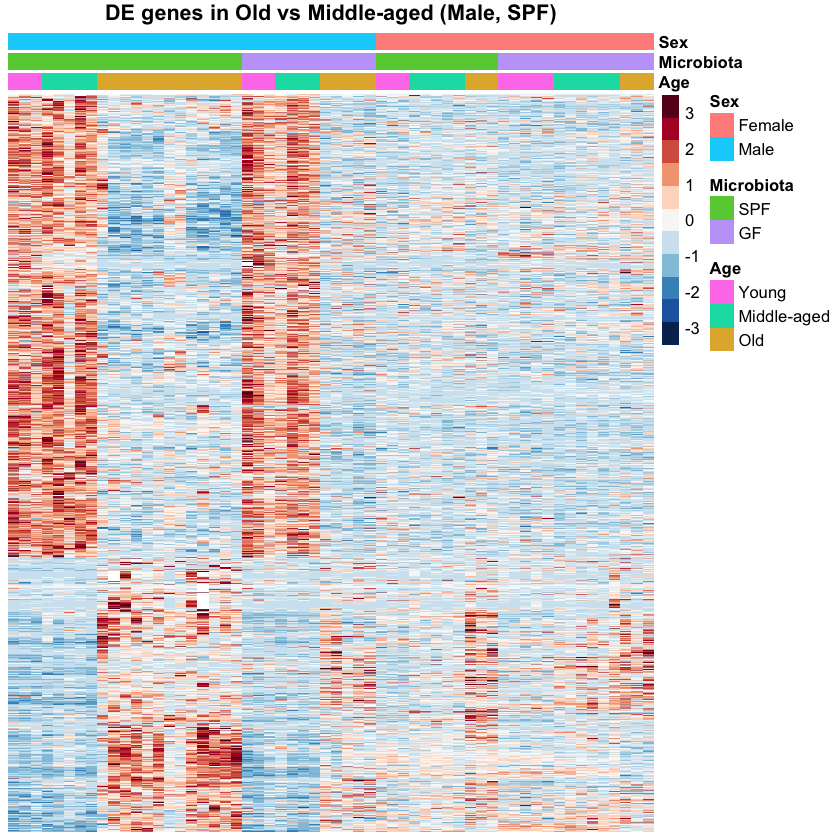

...

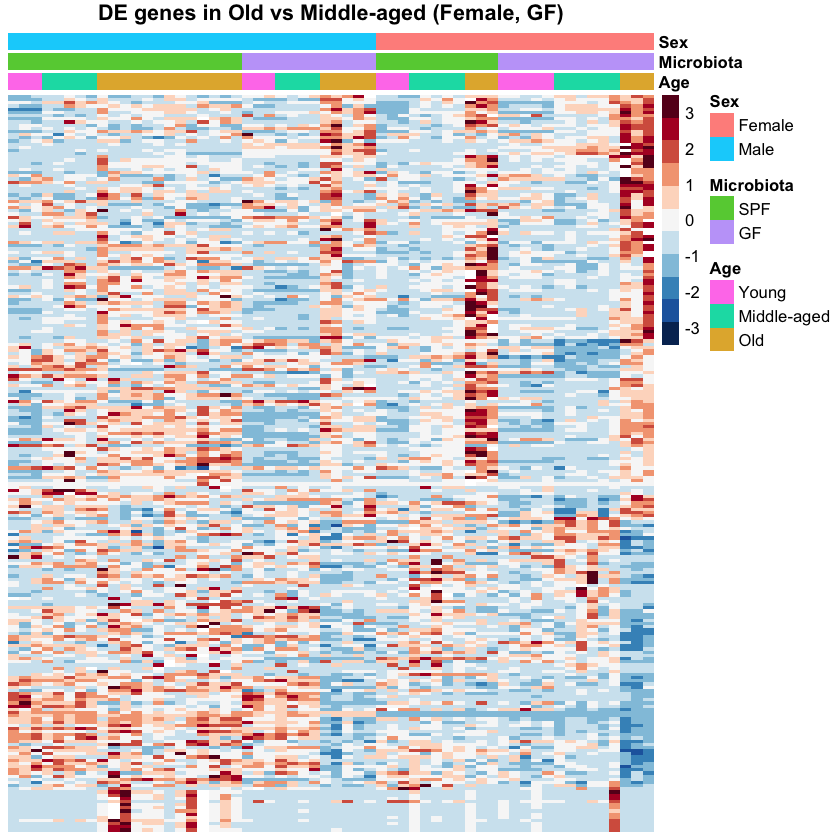

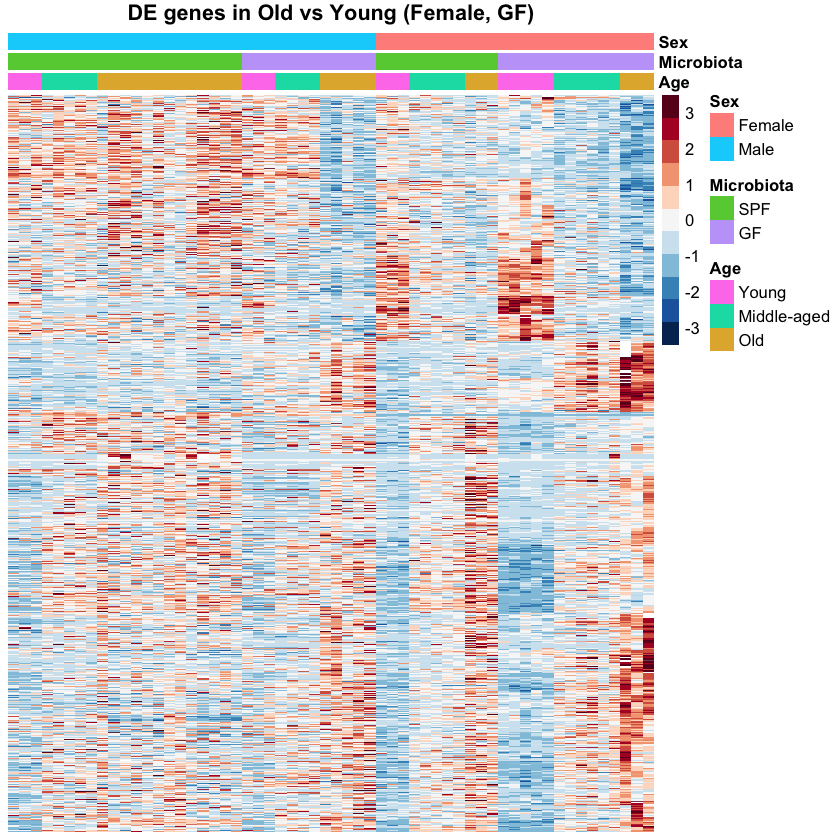

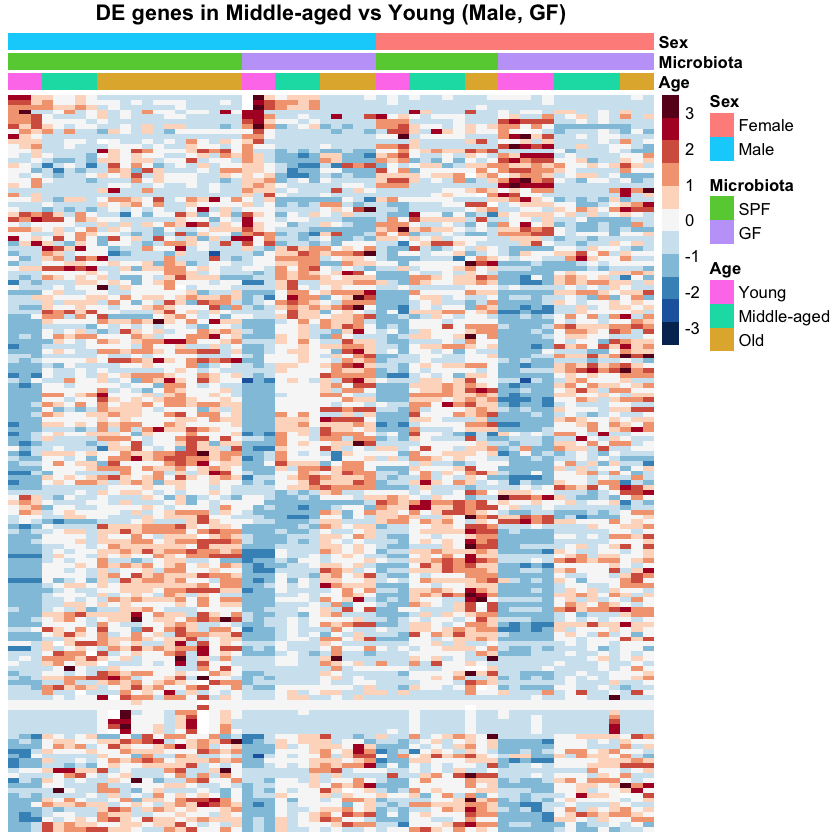

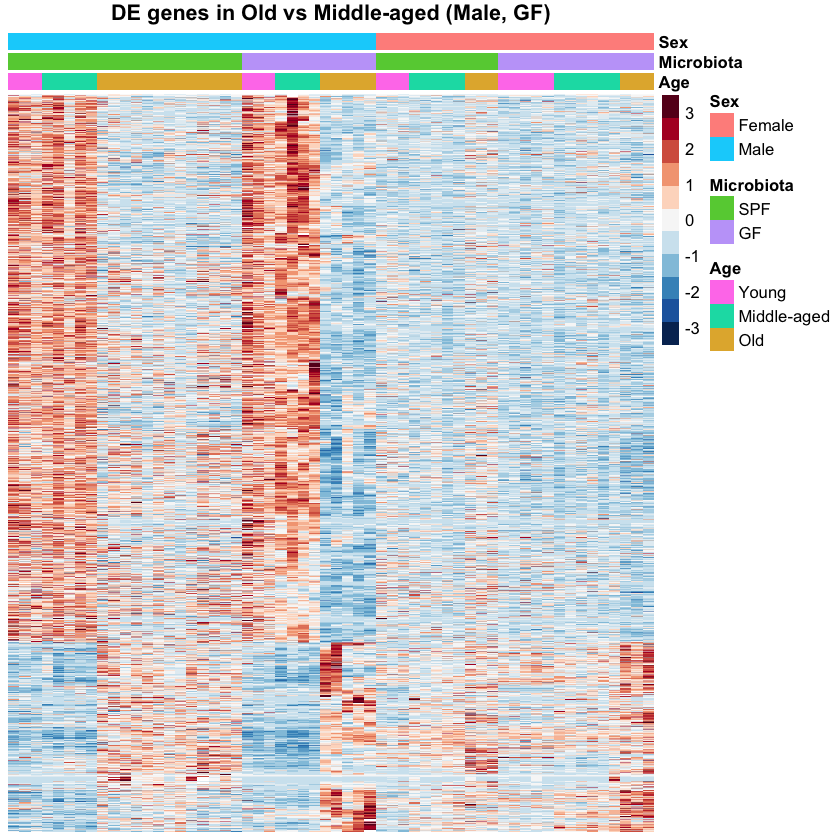

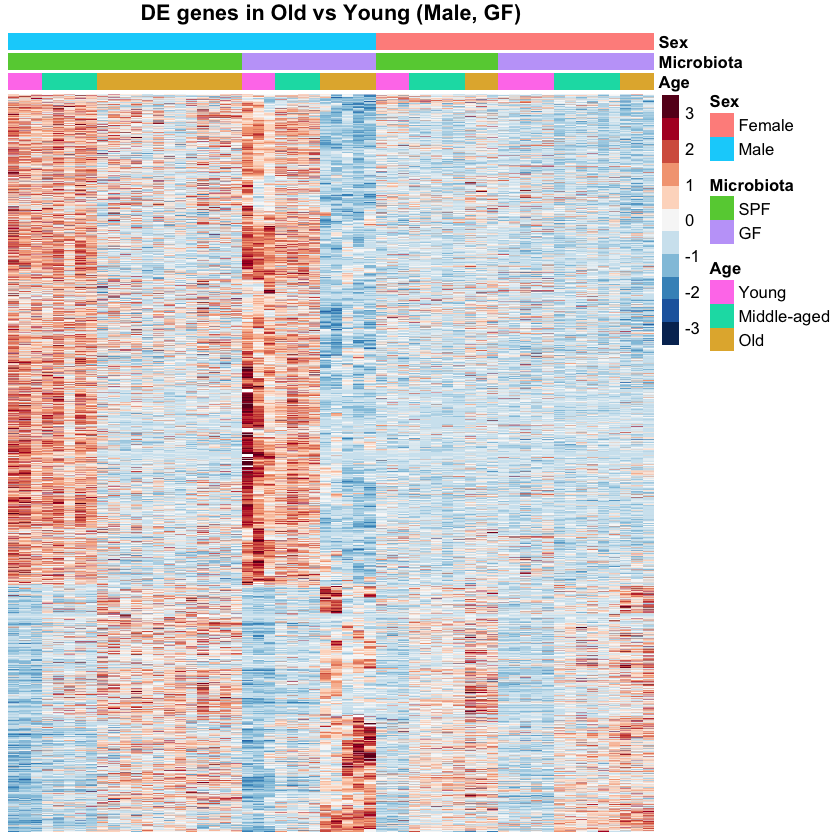

In [17]:
for(comp in names(comps)){
    plot_z_score_heatmap(z_scores,
        deg$sign_fc_deg %>% filter(!is.na((!!as.name(comp)))) %>% pull(genes),
        col_order$sma,
        annot_col$sma,
        paste("DE genes in", comp),
        comps[[comp]])
}

# Co-expression (WGCNA)

## Z-score in modules

In [18]:
comps = names(comps)

### Column order: microbiota - sex - age

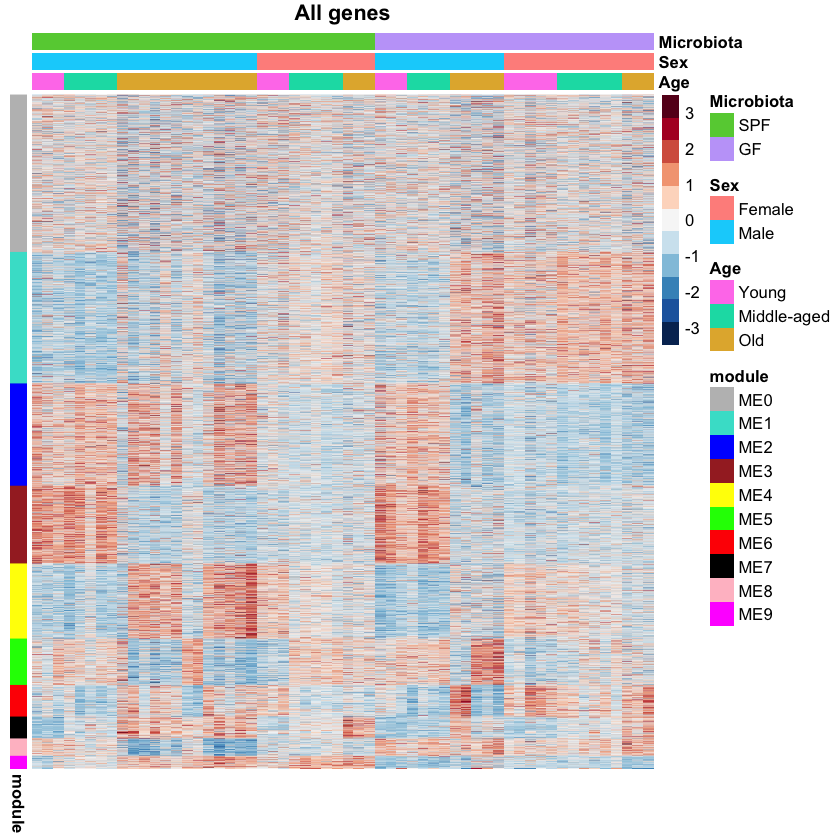

In [19]:
plot_z_score_heatmap_with_modules(z_scores,
                                  rownames(z_scores),
                                  col_order$msa,
                                  annot_col$msa,
                                  genes_in_modules,
                                  "All genes")

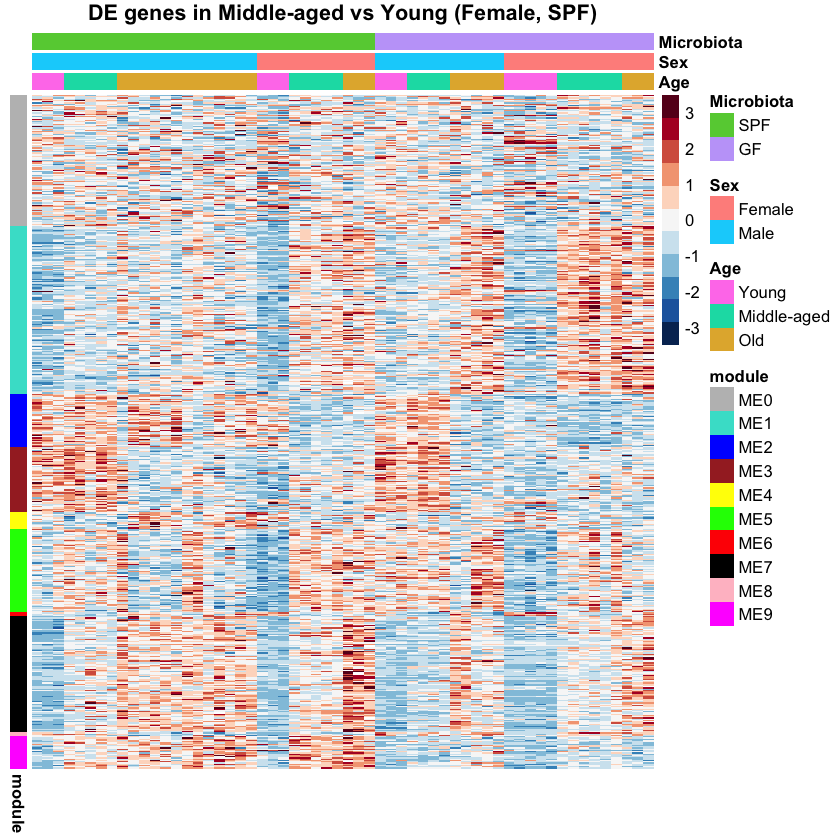

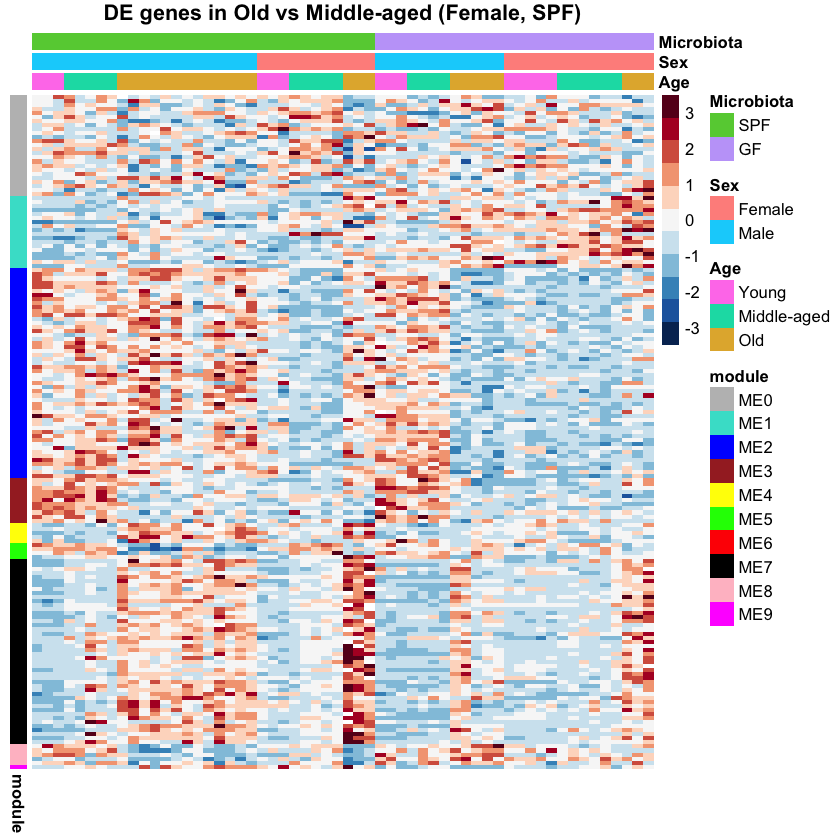

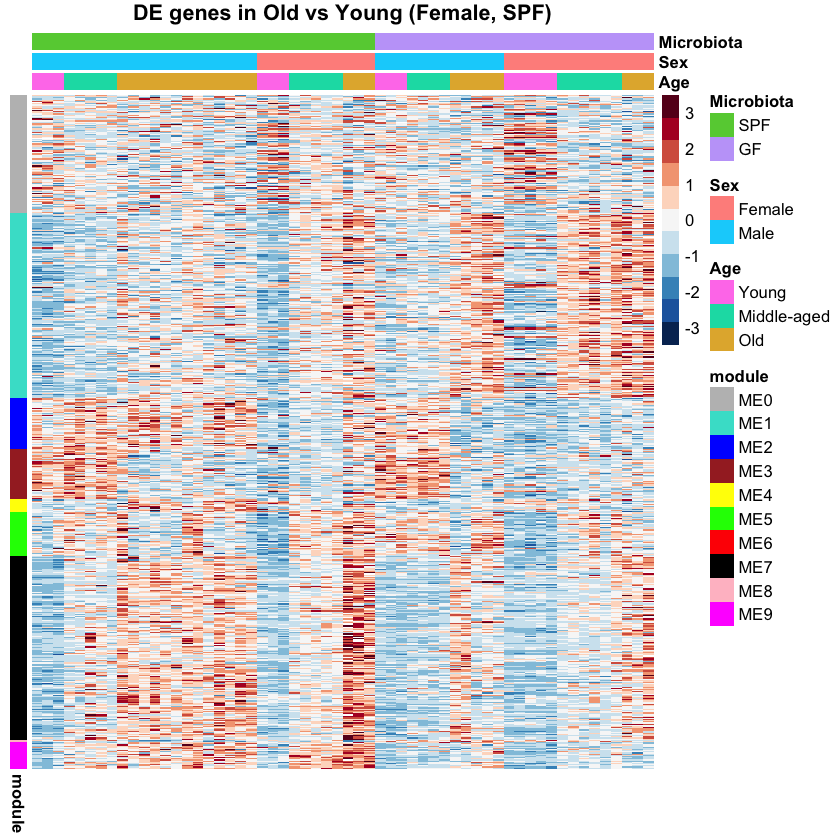

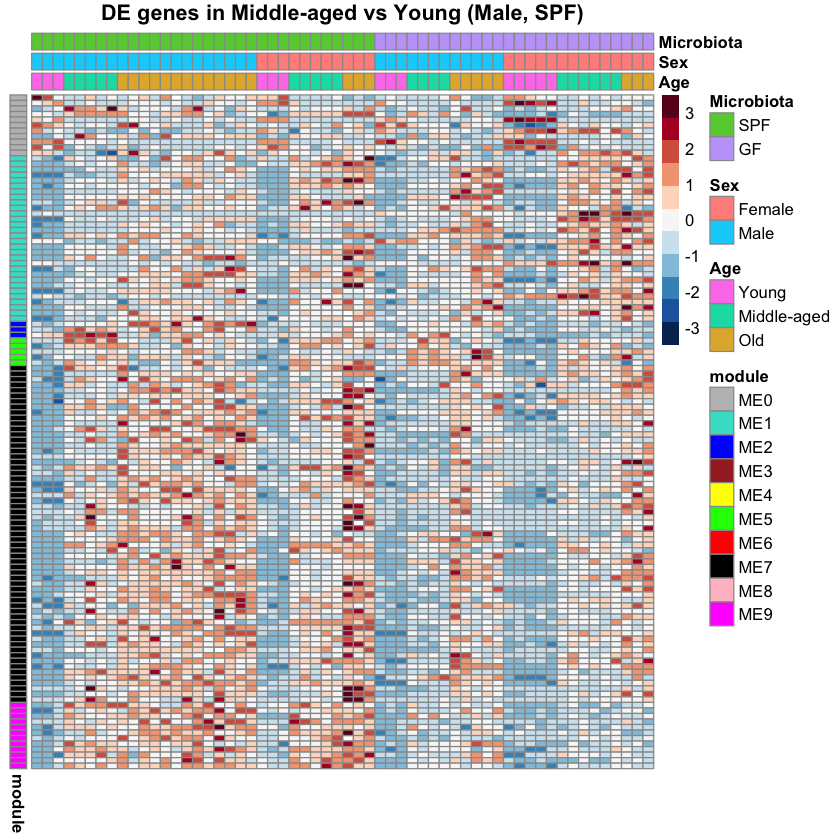

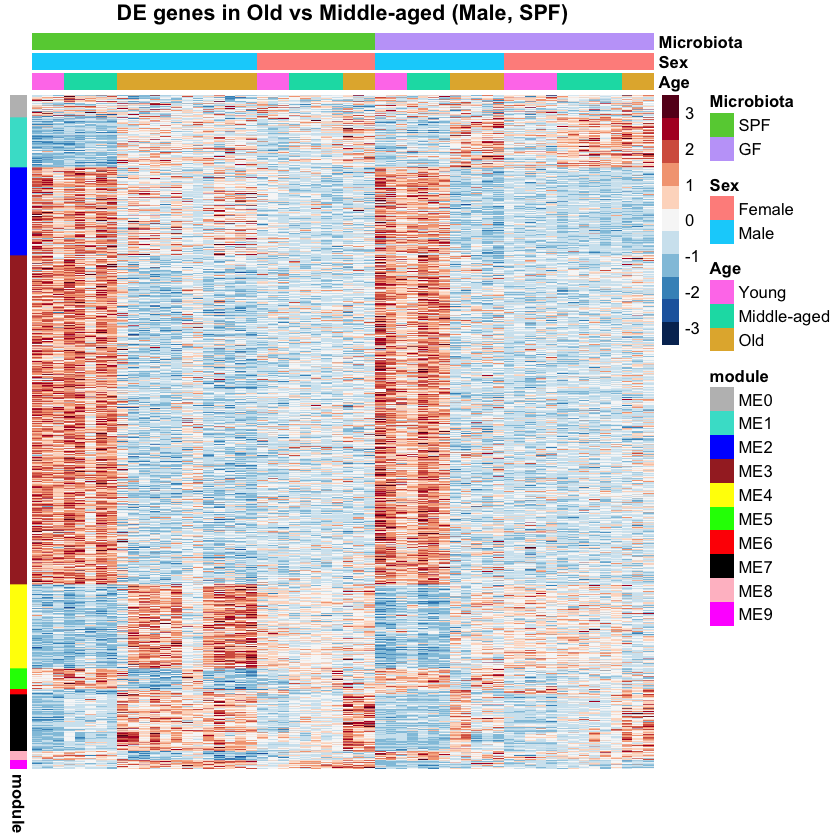

...

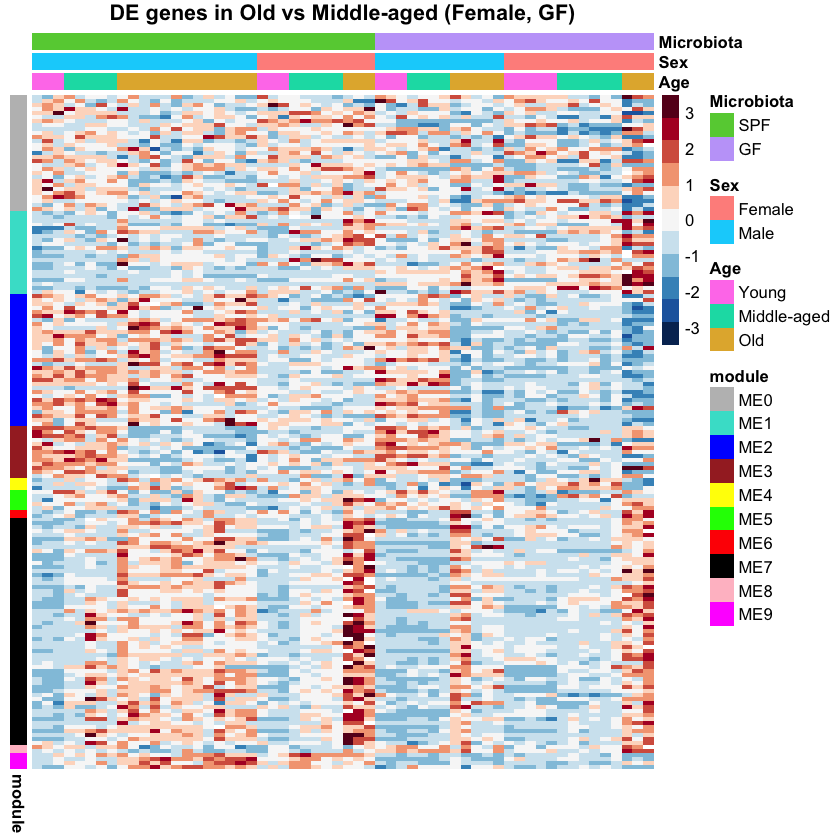

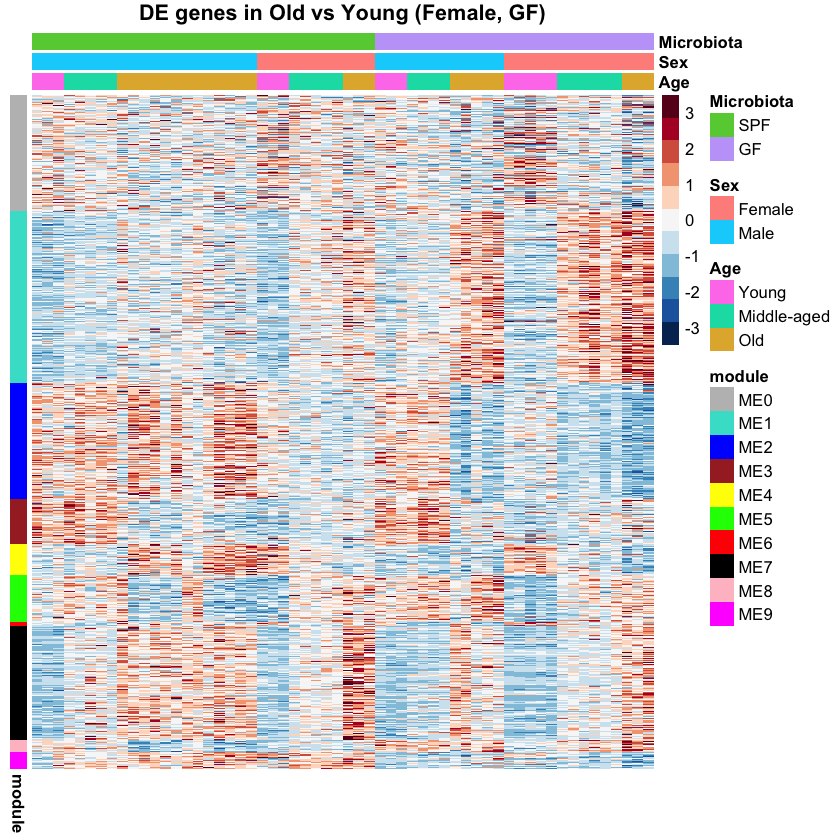

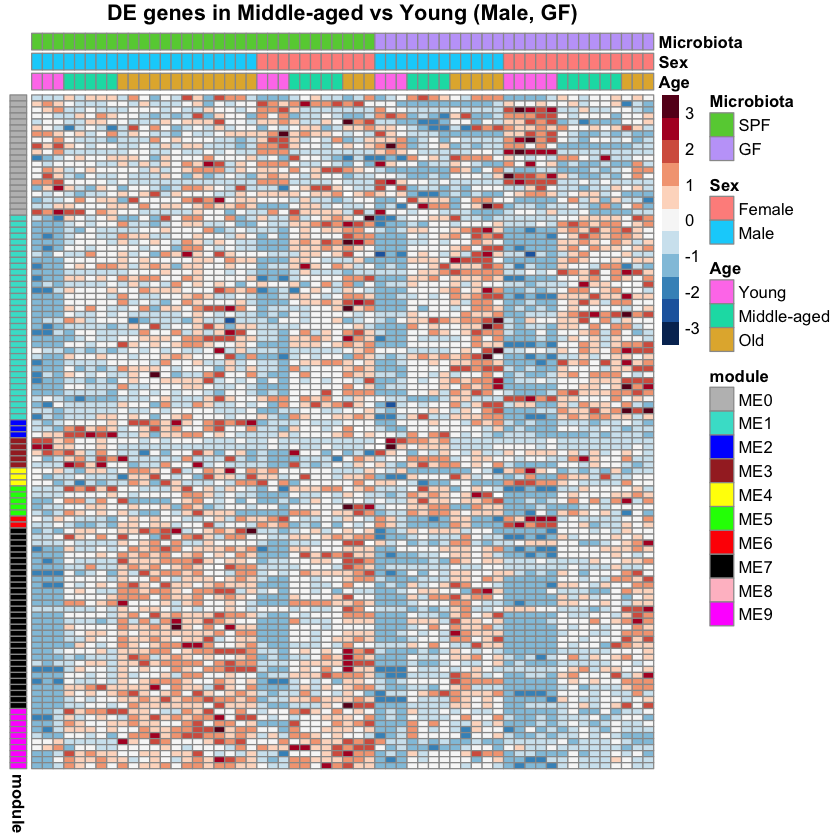

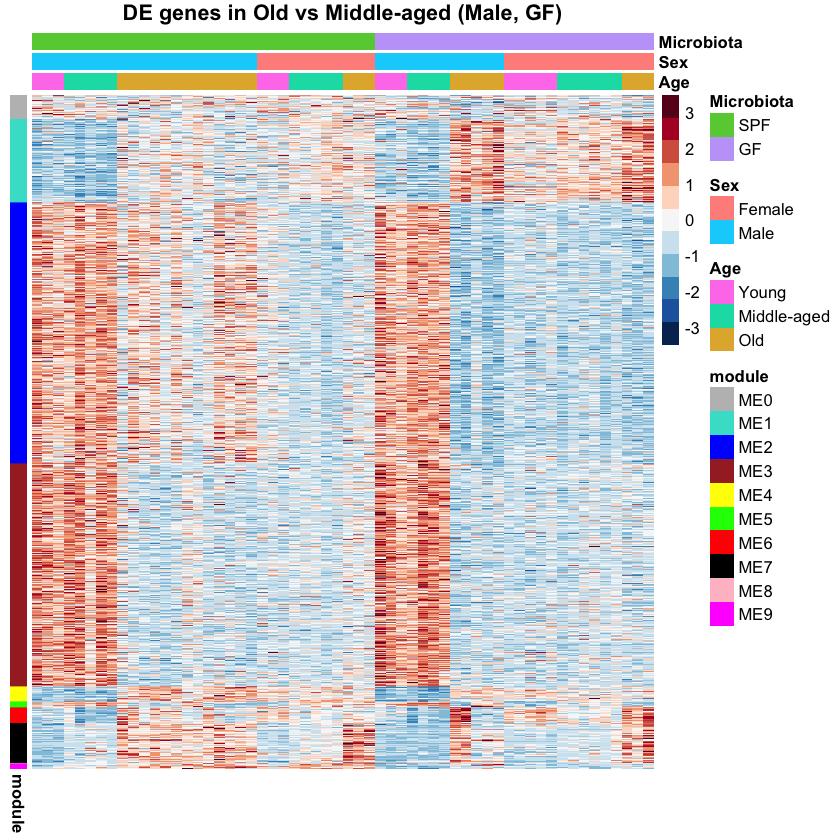

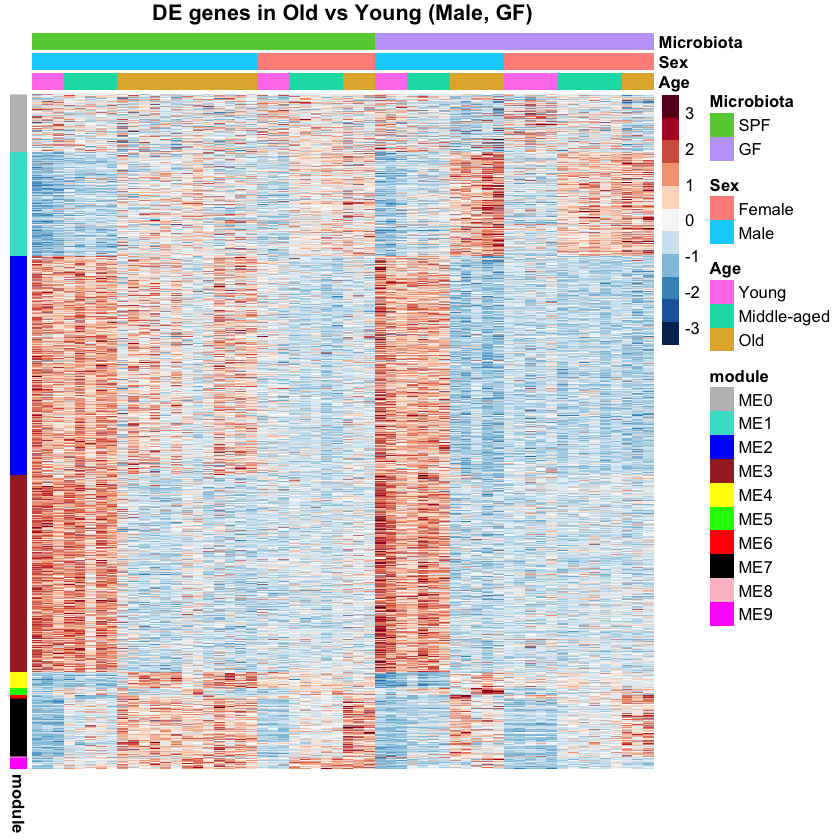

In [20]:
for(comp in comps){
    plot_z_score_heatmap_with_modules(z_scores,
        deg$sign_fc_deg %>% filter(!is.na((!!as.name(comp)))) %>% pull(genes),
        col_order$msa,
        annot_col$msa,
        genes_in_modules,
        paste("DE genes in", comp))
}

### Column order: sex - microbiota - age

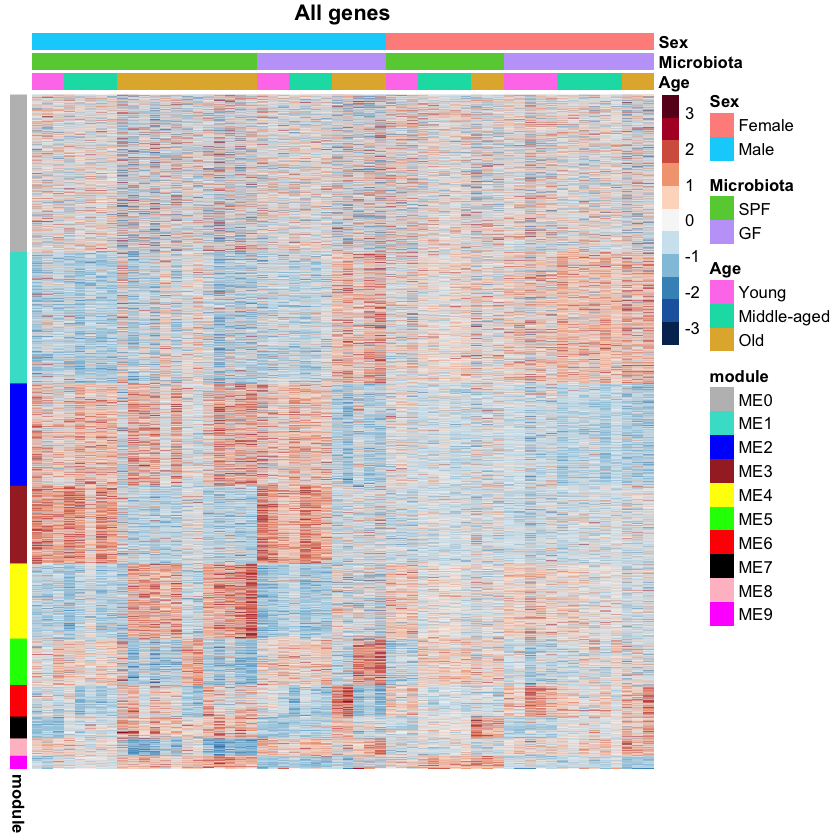

In [21]:
plot_z_score_heatmap_with_modules(z_scores,
    rownames(z_scores),
    col_order$sma,
    annot_col$sma,
    genes_in_modules,
    "All genes")

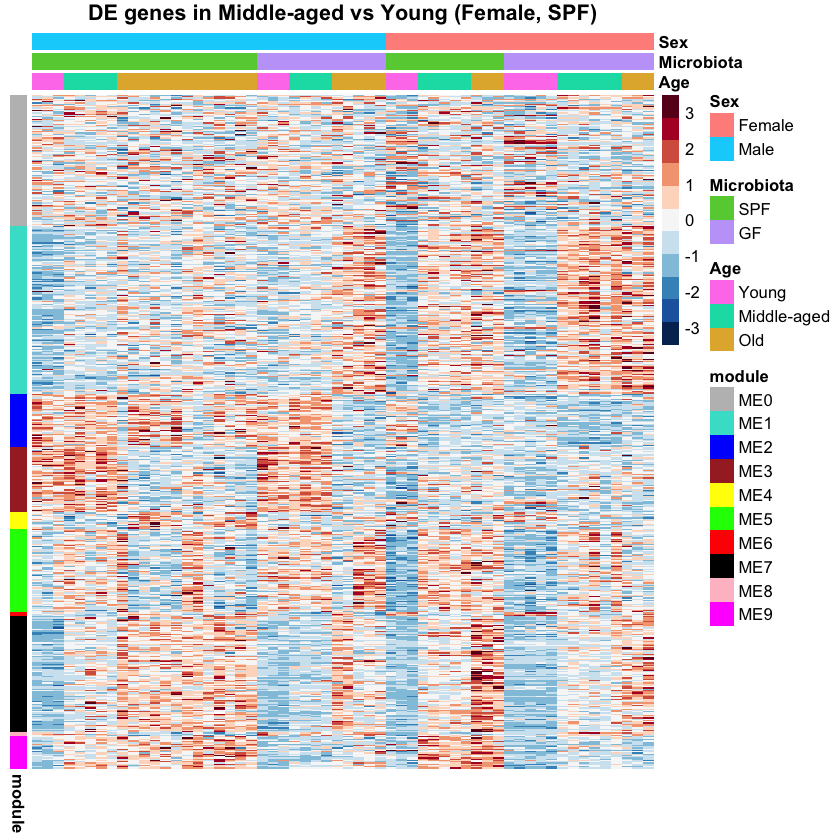

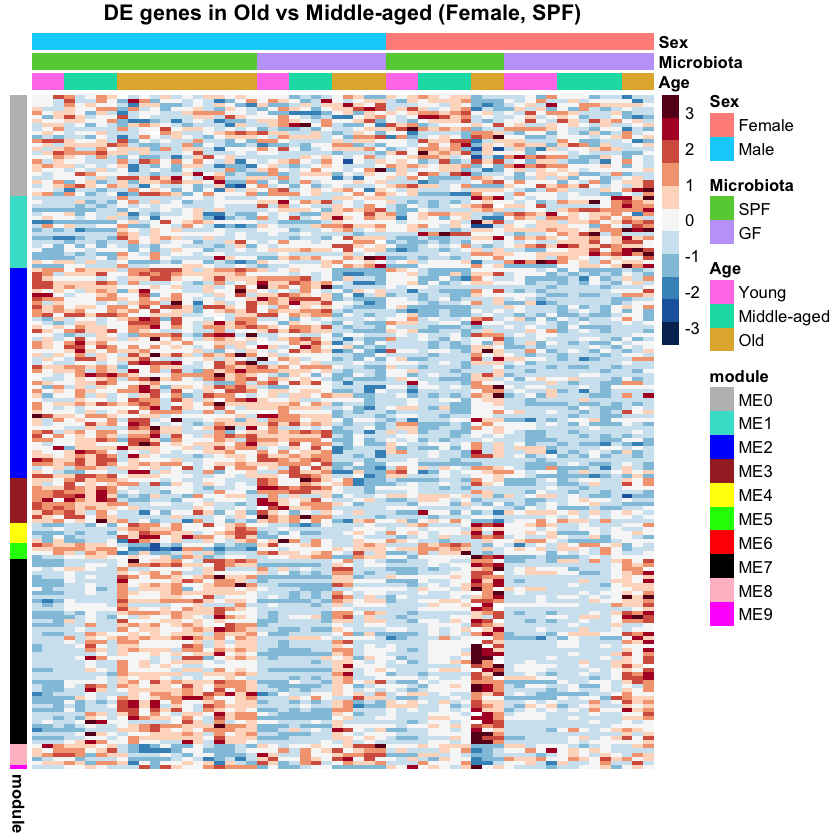

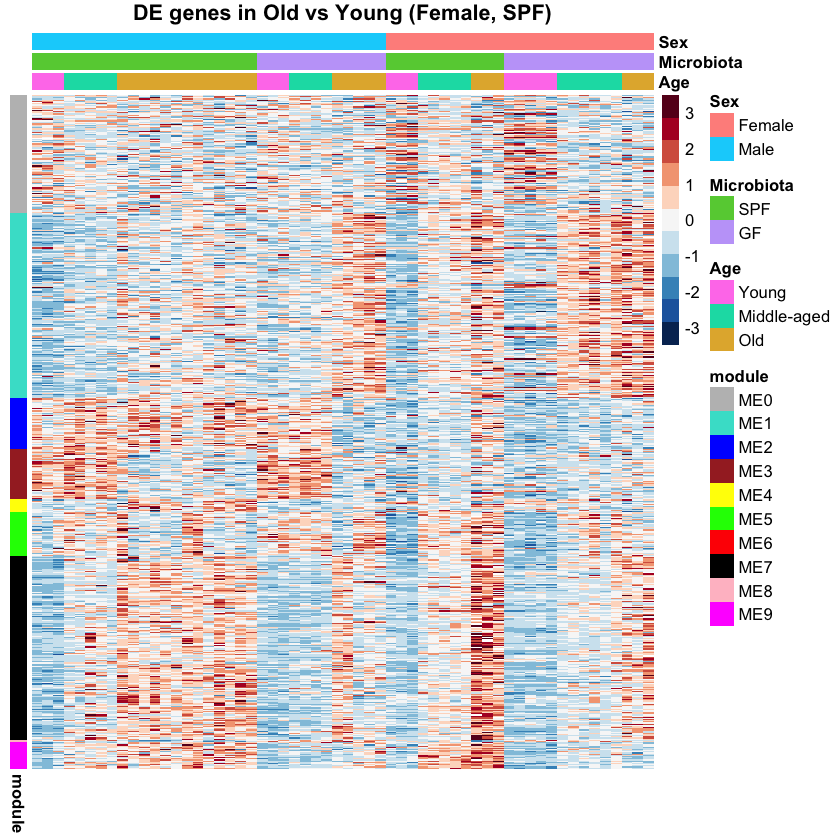

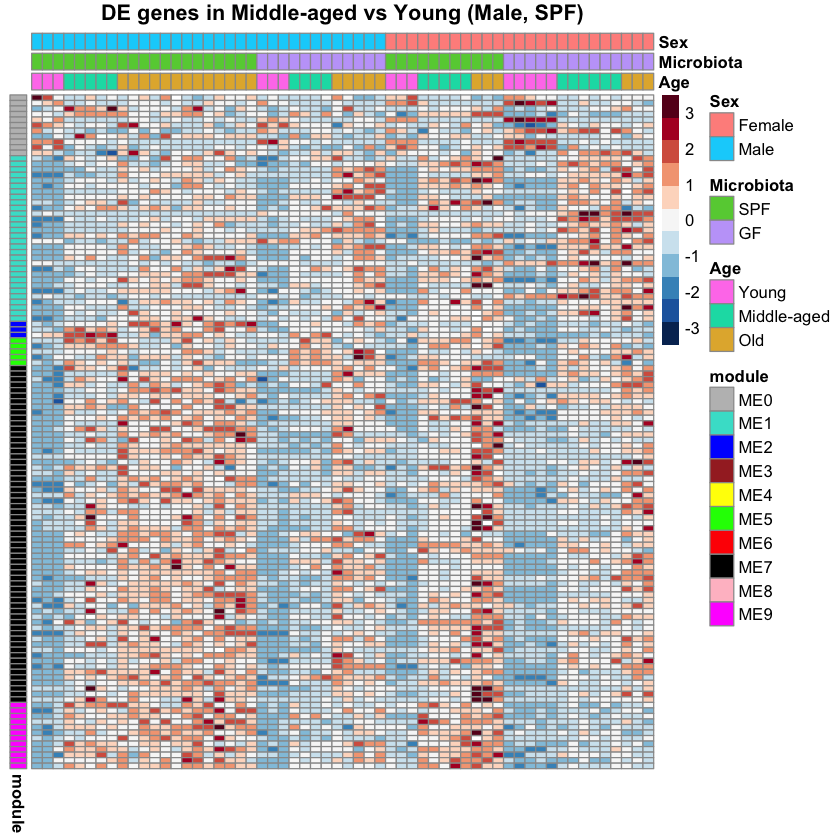

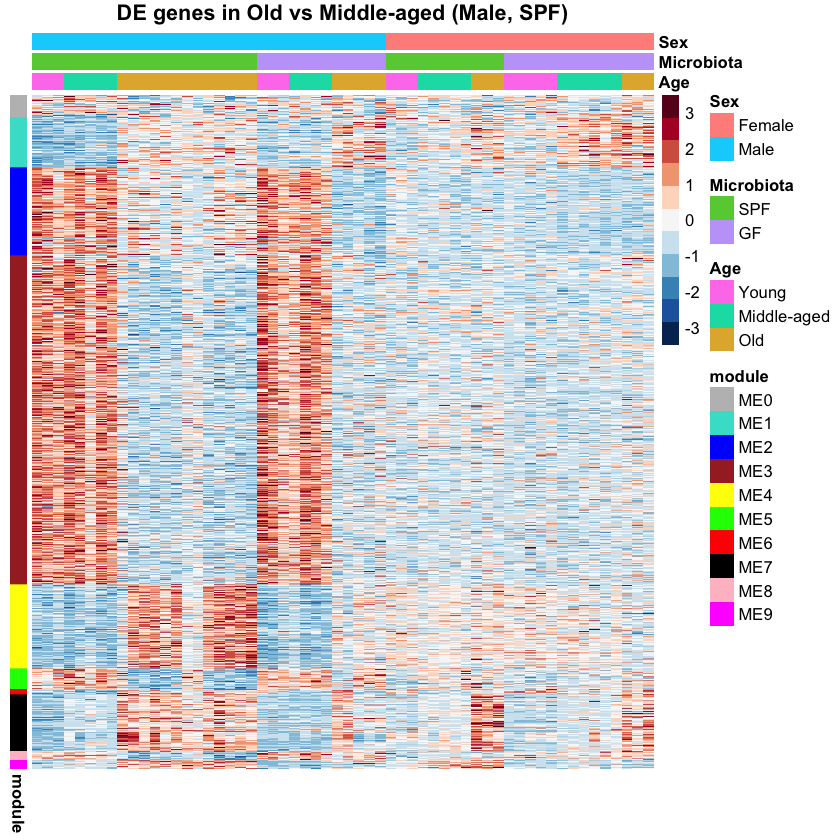

...

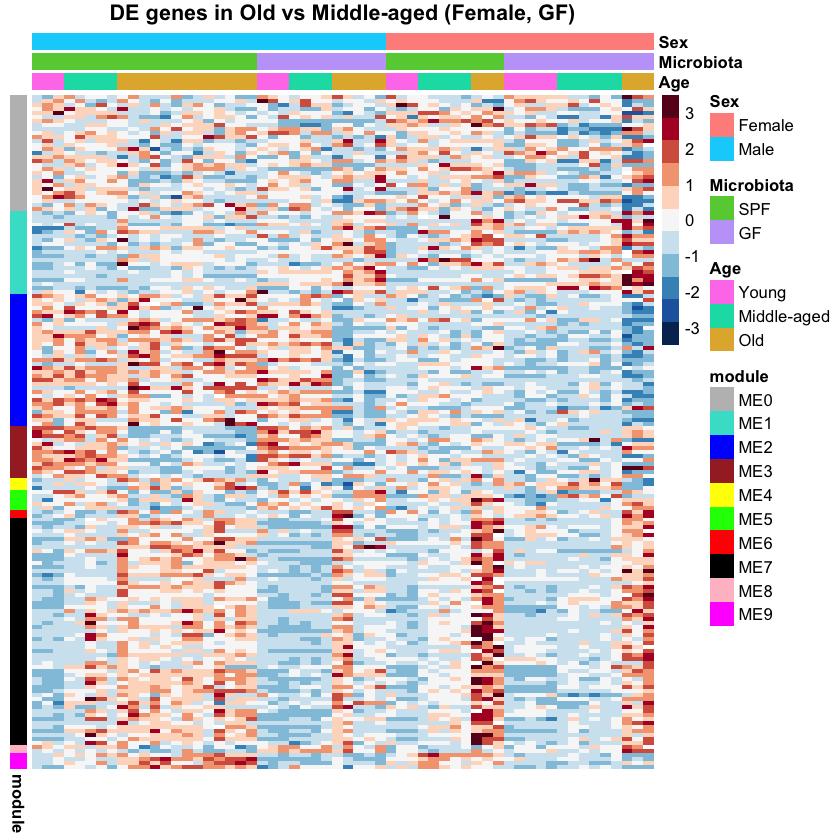

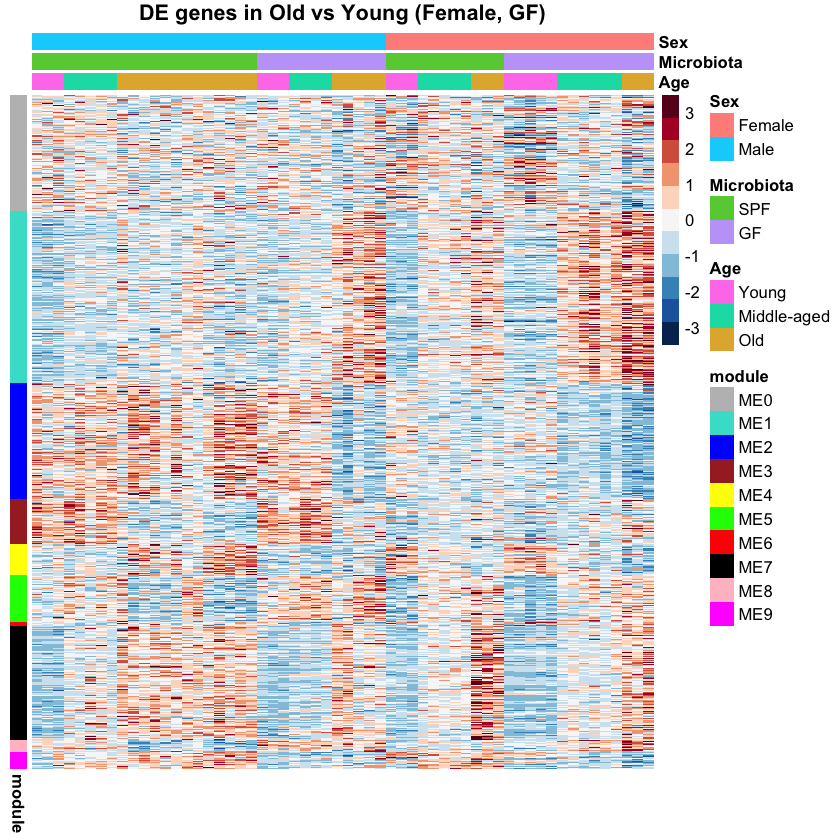

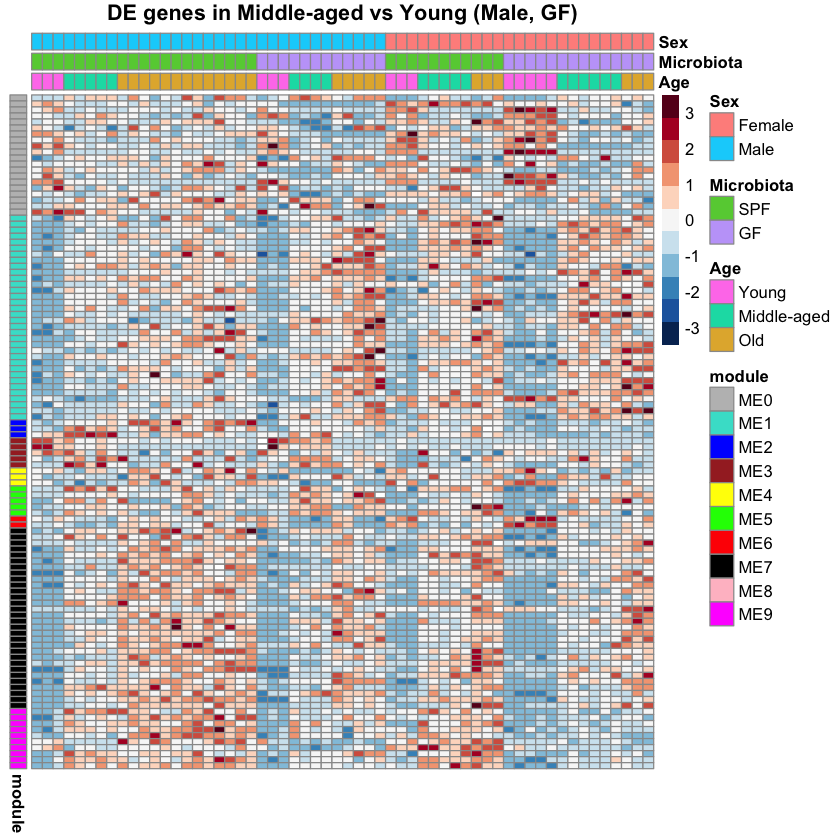

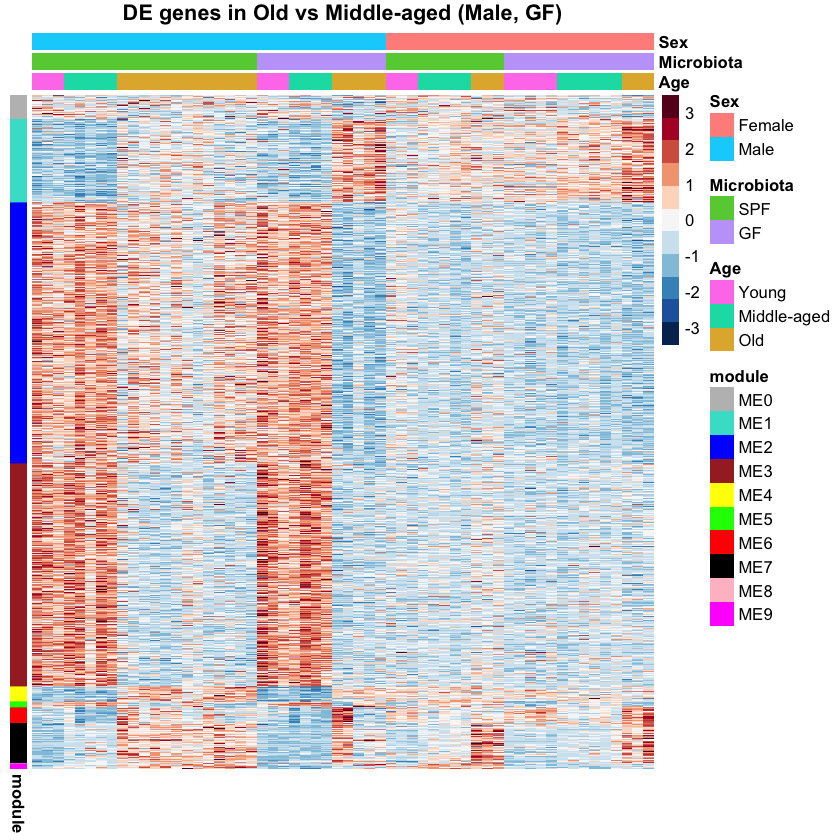

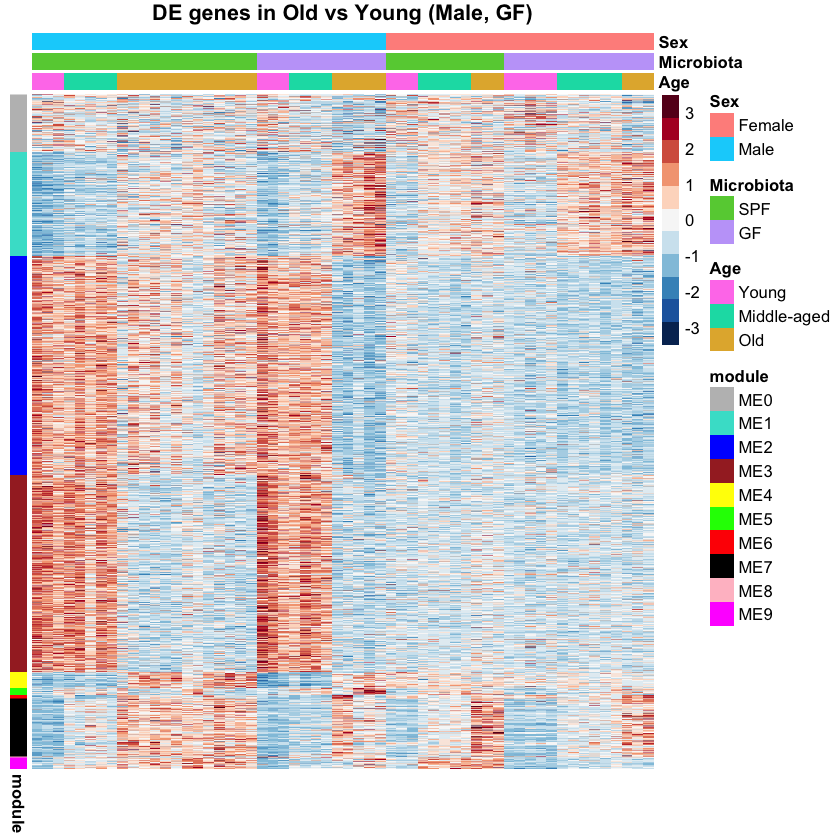

In [22]:
for(comp in comps){
    plot_z_score_heatmap_with_modules(z_scores,
        deg$sign_fc_deg %>% filter(!is.na((!!as.name(comp)))) %>% pull(genes),
        col_order$sma,
        annot_col$sma,
        genes_in_modules,
        paste("DE genes in", comp))
}

### Genes in modules

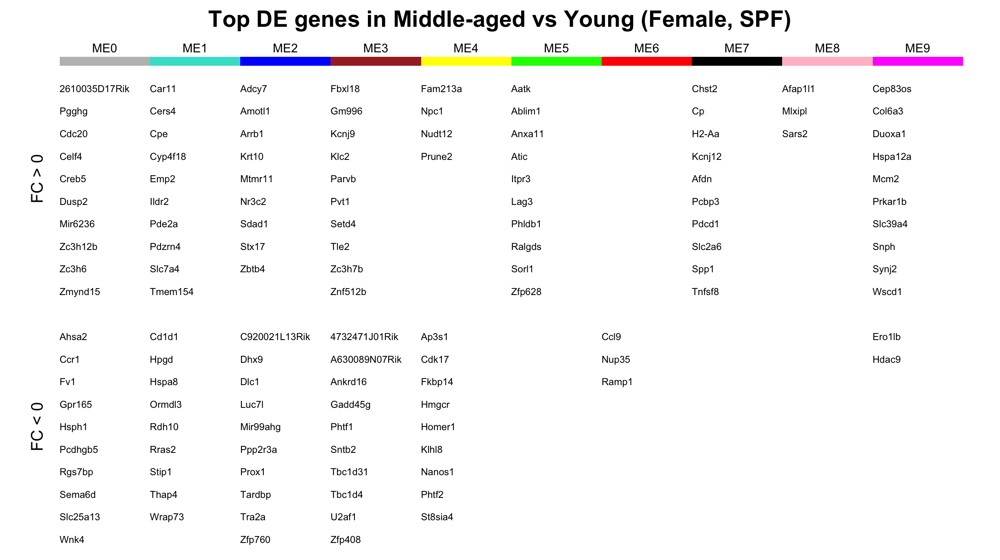

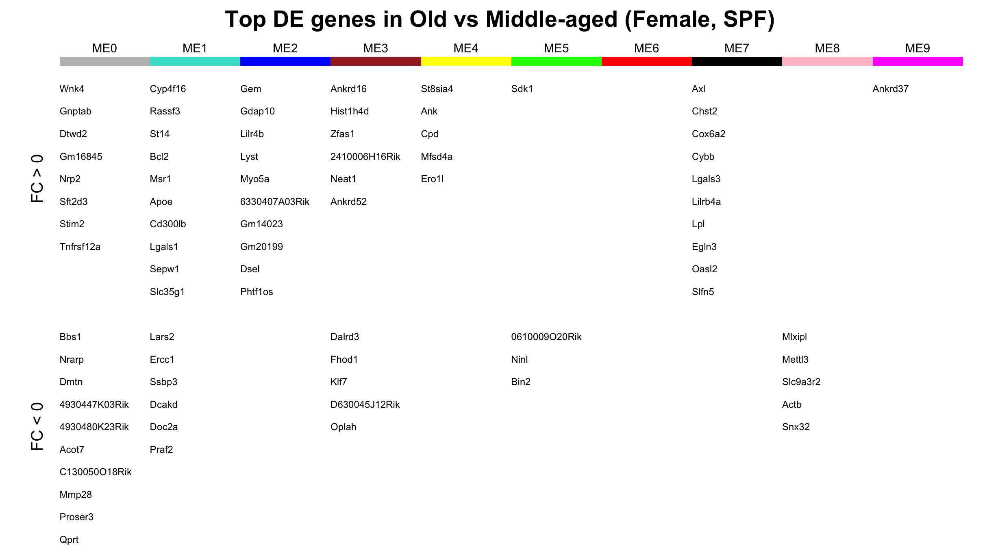

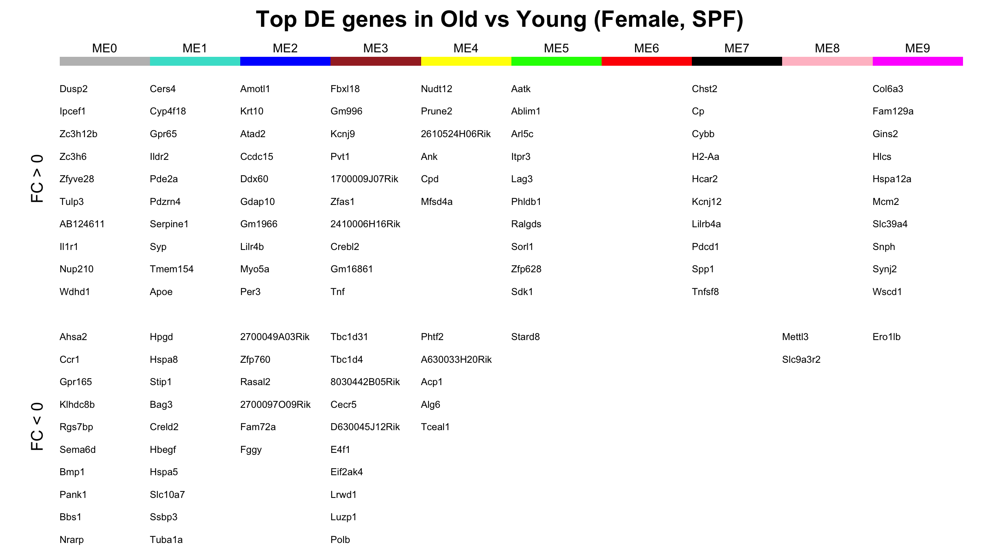

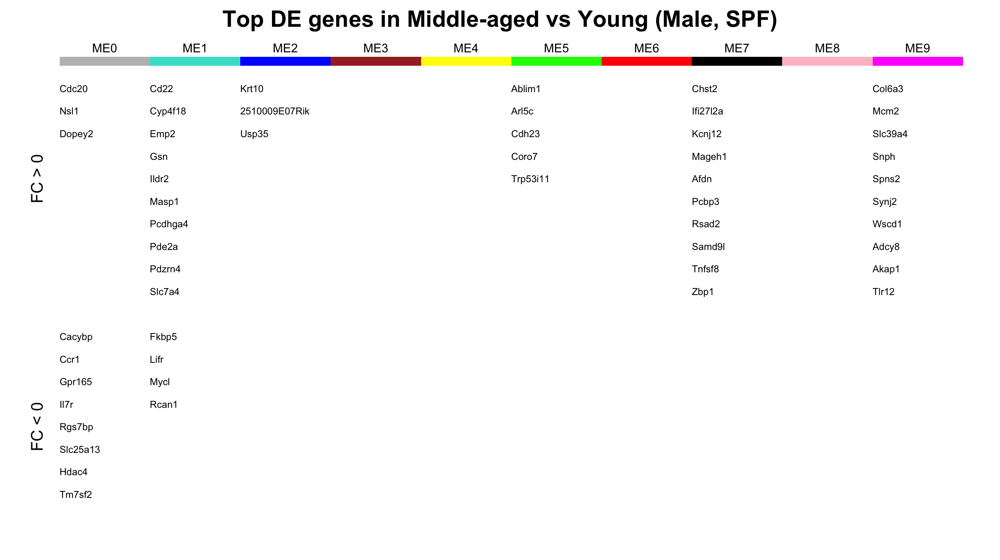

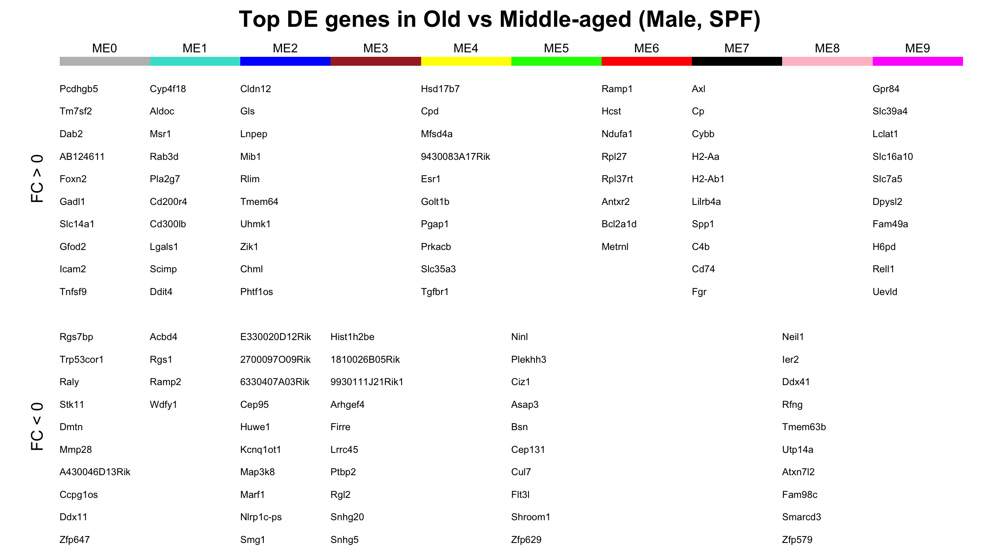

...

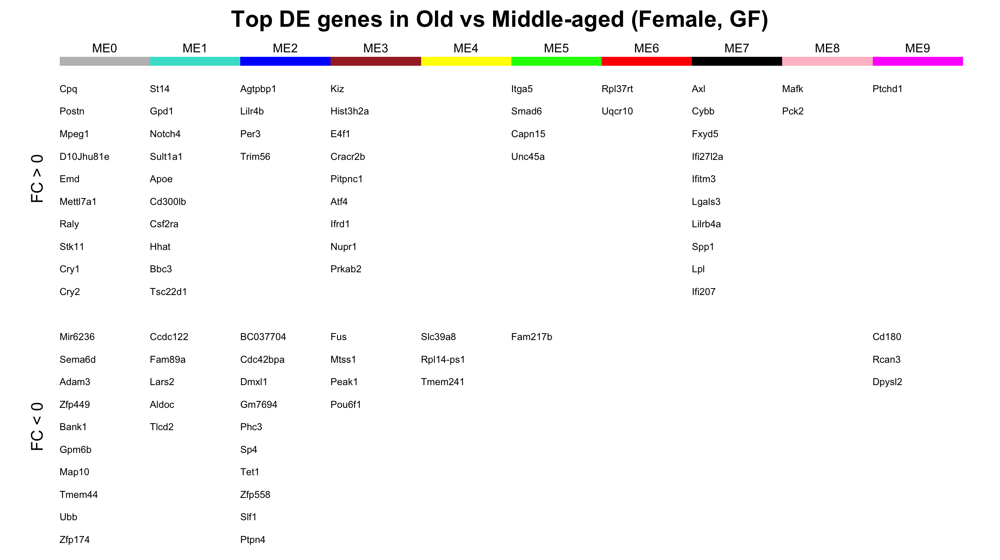

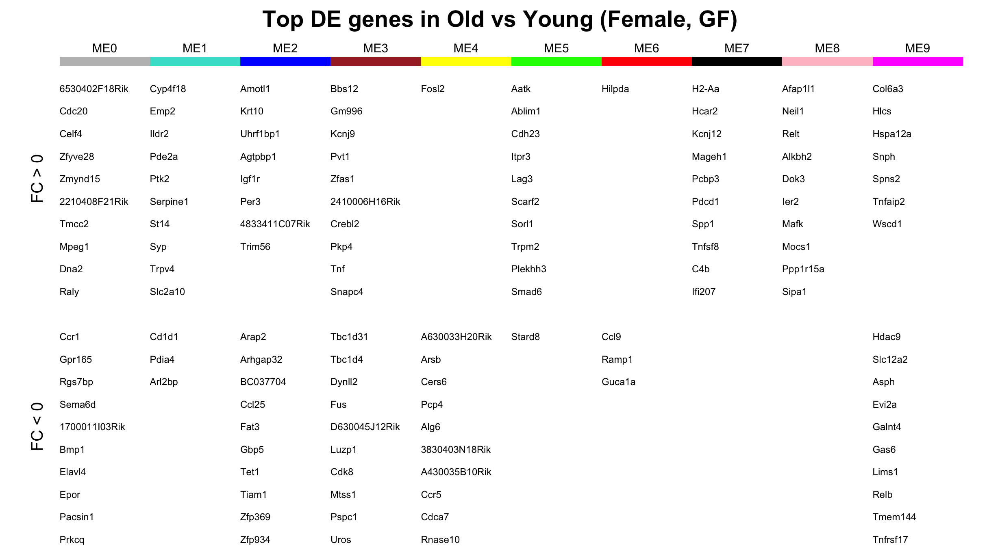

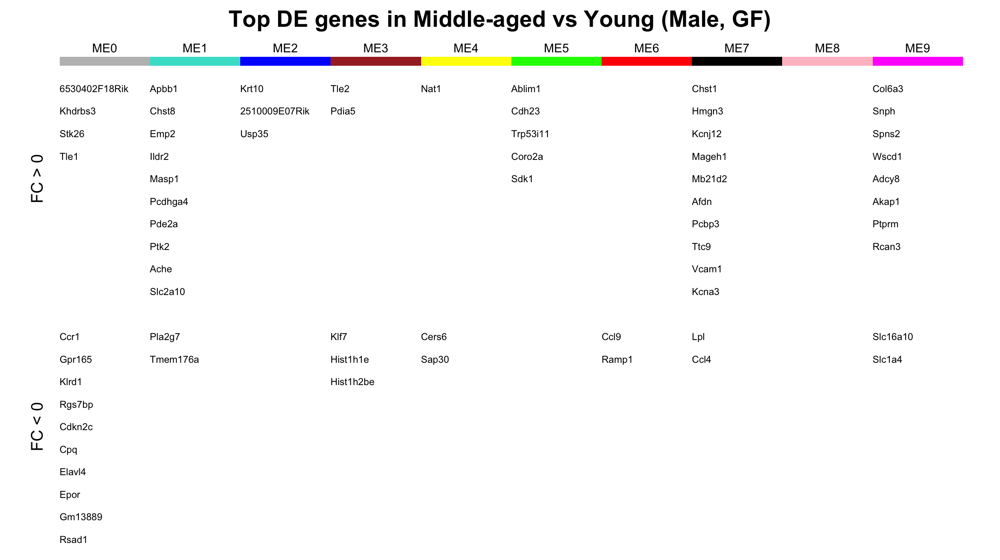

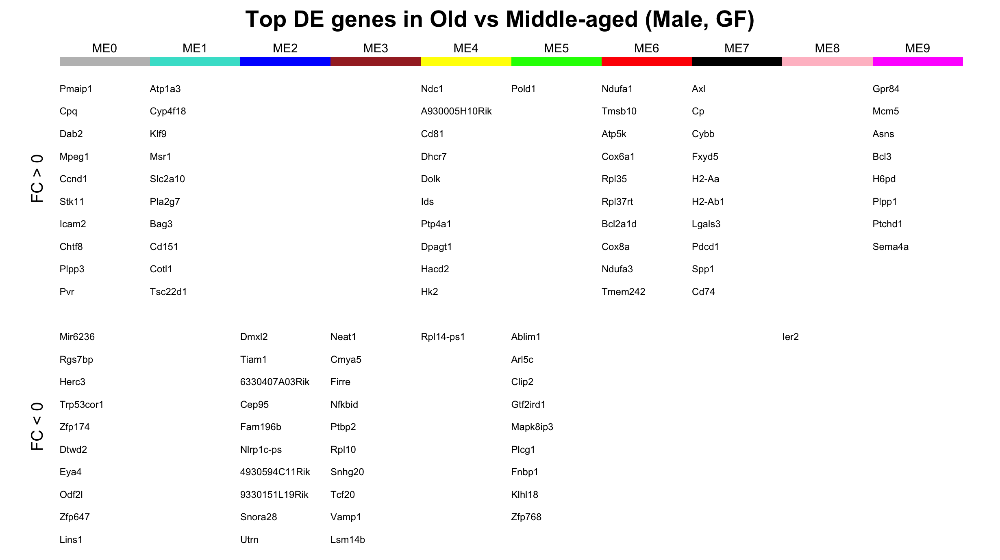

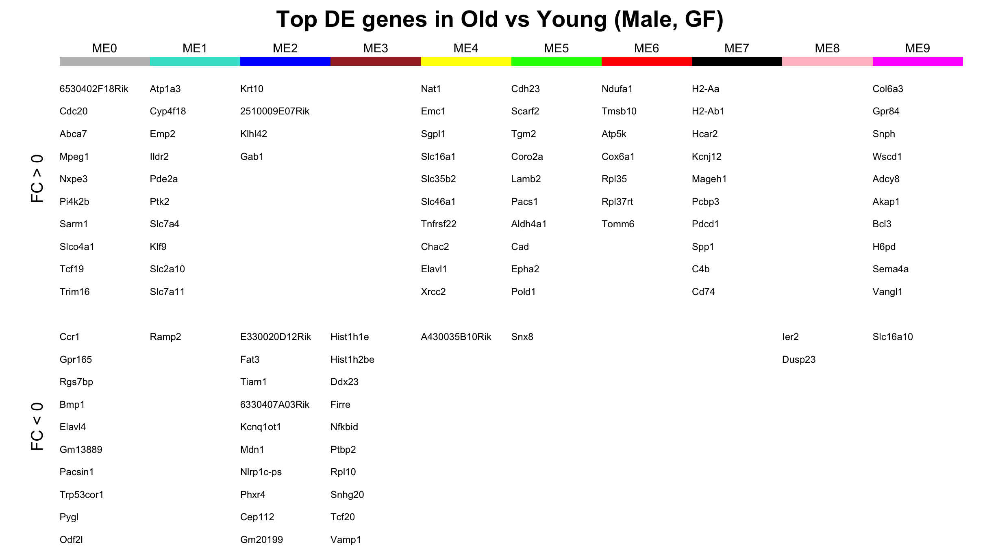

In [23]:
for(comp in comps){
    plot_top_deg_in_modules(deg$sign_fc_deg, comp, genes_in_modules)
}
options(repr.plot.width=7, repr.plot.height=7)

# Enrichment analysis

In [24]:
deg = fit_proba_weighting_function(deg, gene_length)

Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”Warning message in pcls(G):
“initial point very close to some inequality constraints”

## GO analysis

In [25]:
deg = extract_GO_terms(deg, dir_path)

Warning message in stack.default(getgo(l$sign_fc_deg$genes, "mm10", "geneSymbol")):
“non-vector elements will be ignored”

### Biological process

Dot-plot with the 10 most significant p-values for the different comparison

Using category as id variables
Using category, type as id variables
Warning message:
“Column `variable` joining factors with different levels, coercing to character vector”

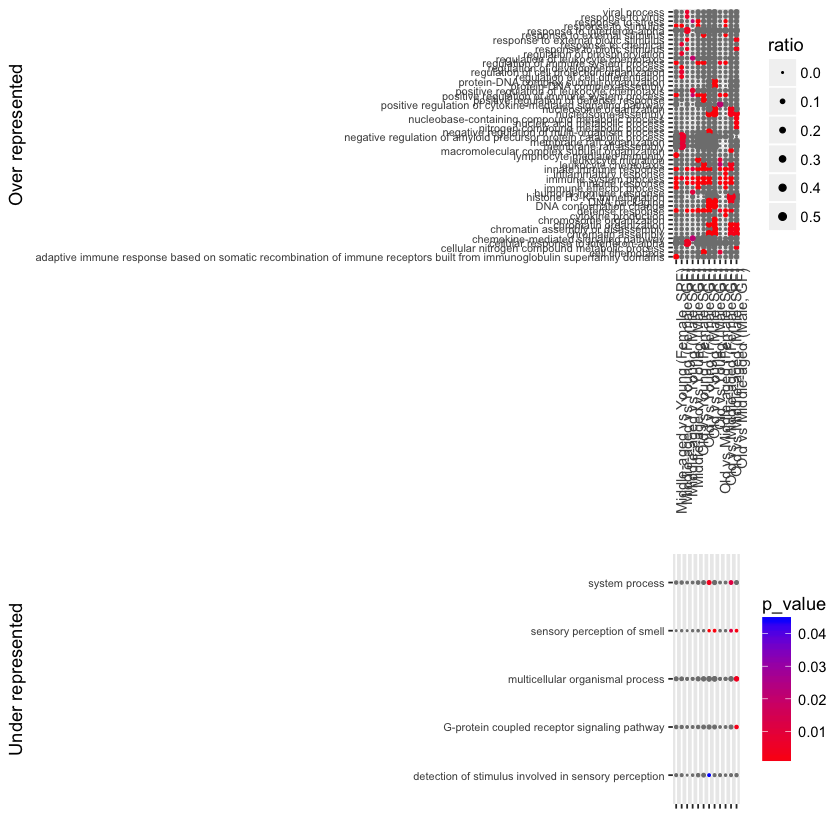

In [26]:
plot_top_go(deg, "BP", 10)

### Cellular components

Dot-plot with the most over-represented CC GO (20 most significant p-values for the different comparison)

Using category as id variables
Using category, type as id variables
Warning message:
“Column `variable` joining factors with different levels, coercing to character vector”

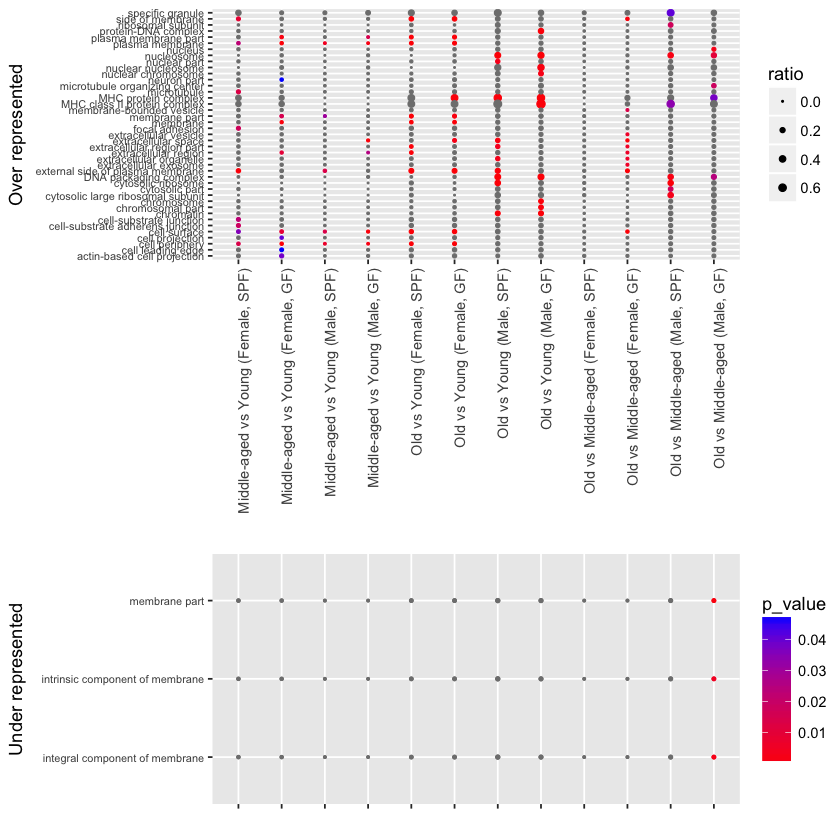

In [27]:
plot_top_go(deg, "CC", 10)

### Molecular functions

Dot-plot with the most over-represented MF GO (20 most significant p-values for the different comparison)

Using category as id variables
Using category, type as id variables
Warning message:
“Column `variable` joining factors with different levels, coercing to character vector”

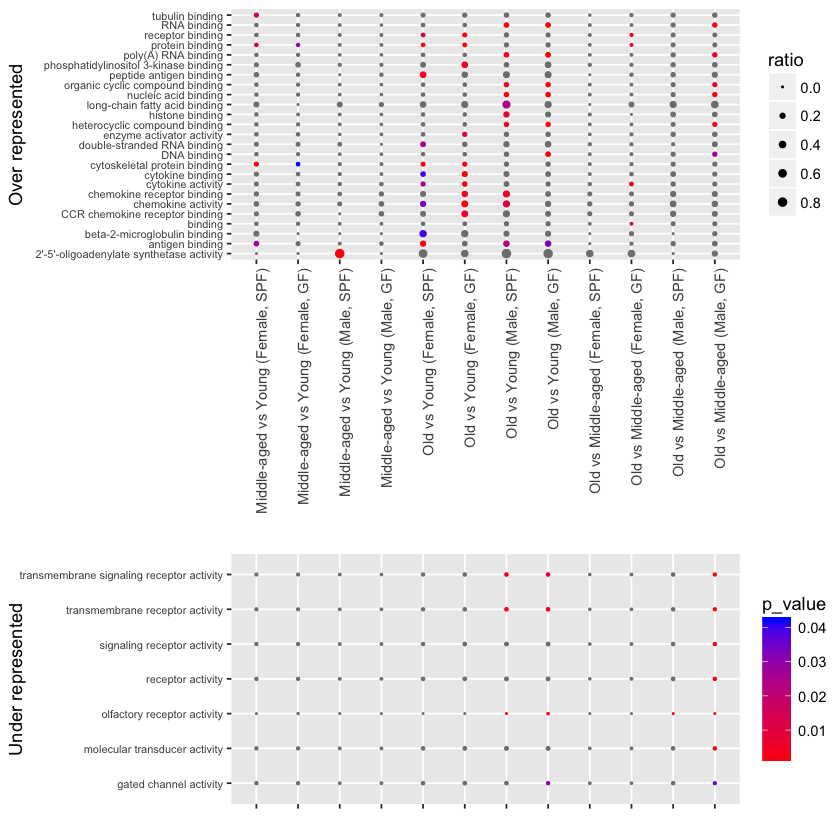

In [28]:
plot_top_go(deg, "MF", 10)

### GO networks

The edge colors in the tree represent the relationship between two nodes. - green: positively regulates
- red: negatively regulates
- black: regulates
- blue: is a
- light blue: part of

GO Trees at ["../results/dge/age-effect/age-microbiote-sex/go"](../results/dge/age-effect/age-microbiote-sex/go)

In [29]:
for(comp in comps){
    print(comp)
    fn = gsub(' ', '_', comp)
    fn = gsub('(\\(|\\)|,)', '', fn)
    fp = paste('../results/dge/', dir_path, 'go/', fn, '.png', sep='')
    col = get_GO_network_col_all_ont(deg$GO, comp)
    dotRes = getAmigoTree(goIDs=col$category,
                          color=col$color,
                          filename=fp,
                          picType="png",
                          saveResult=TRUE)
}

[1] "Middle-aged vs Young (Female, SPF)"


Warning message:
“Column `values` has different attributes on LHS and RHS of join”Warning message:
“Column `values` has different attributes on LHS and RHS of join”

ERROR: Error in mutate_impl(.data, dots): Evaluation error: factor level [183] is duplicated.


## KEGG pathways

In [ ]:
deg = extract_KEGG_pathways(deg, dir_path)

In [ ]:
plot_kegg_pathways(deg$KEGG$over$category,
                   deg$sign_fc_deg,
                   paste('../results/dge/', dir_path, '/kegg/over_repr_kegg/', sep=''))

Pathway graphs available at ../results/dge/age-effect/age_type_gender/over_repr_kegg/

In [ ]:
plot_kegg_pathways(deg$under_represented_KEGG[,"category"],
                   deg$fc_deg,
                   paste('../results/dge/', dir_path, '/kegg/under_repr_kegg/', sep=''))

Pathway graphs available at ../results/dge/age-effect/age_type_gender/under_repr_kegg/